In [1064]:
import scipy.fftpack
import scipy as sp

import numpy as np
from scipy import signal
from scipy import interpolate
import pandas as pd
import matplotlib.pyplot as plt


from scipy.signal import resample
from scipy.interpolate import interp1d

from sklearn import preprocessing
from sklearn.preprocessing import normalize



<br><br>1. Read data file(s) given in data.zip. There are several simultaneously measured and time synced signals (ecg and two ppg sensors both with three wavelengts). Plot these signals and visually inspect them.<br><br>

In [1065]:
clean = pd.read_csv("ecg_ppg_clean.csv")
# clean_ppg1 = pd.read_csv("ecg_ppg_clean.csv", names = ["timestamps_ppg_1_green", "ppg_1_green", "timestamps_ppg_1_red" , 
#                                                        "ppg_1_red", "timestamps_ppg_1_ir", " ppg_1_ir""])
clean_ecg = clean.loc[0: ,["timestamps_ecg", "ecg"]]
clean_ppg1 = clean.loc[0: ,["timestamps_ppg_1_green", "ppg_1_green", "timestamps_ppg_1_red" , 
                                                      "ppg_1_red", "timestamps_ppg_1_ir", "ppg_1_ir"]]
clean_ppg2 = clean.loc[0: ,["timestamps_ppg_2_green", "ppg_2_green", "timestamps_ppg_2_red" , 
                                                      "ppg_2_red", "timestamps_ppg_2_ir", "ppg_2_ir"]]
#clean.head() #check that we sampled the columns correctly
clean.head()

,timestamps_ecg,ecg,timestamps_ppg_1_green,ppg_1_green,timestamps_ppg_1_red,ppg_1_red,timestamps_ppg_1_ir,ppg_1_ir,timestamps_ppg_2_green,ppg_2_green,timestamps_ppg_2_red,ppg_2_red,timestamps_ppg_2_ir,ppg_2_ir
0,725290.0,-1949.000000,725314.0,31289.000000,725314.0,2.274565e+06,725314.0,2.544369e+06,725301.0,28101.000000,725301.0,2.534342e+06,725301.0,2.540145e+06
1,725368.0,-1737.708861,725414.0,31255.336634,725414.0,2.274575e+06,725414.0,2.544328e+06,725401.0,28117.666667,725401.0,2.534269e+06,725401.0,2.539954e+06
2,725446.0,-1534.215190,725514.0,31204.029703,725514.0,2.274564e+06,725514.0,2.544304e+06,725501.0,28114.156863,725501.0,2.534142e+06,725501.0,2.539586e+06
3,725524.0,-1413.556962,725614.0,31186.504950,725614.0,2.274553e+06,725614.0,2.544289e+06,725601.0,28101.764706,725601.0,2.533956e+06,725601.0,2.539082e+06
4,725602.0,-1333.050633,725714.0,31166.029412,725714.0,2.274524e+06,725714.0,2.544271e+06,725701.0,28083.490196,725701.0,2.533720e+06,725701.0,2.538444e+06


In [1066]:
motion = pd.read_csv("ecg_ppg_motion.csv")
motion_ecg = motion.loc[0: ,["timestamps_ecg", "ecg"]]
motion_ppg1 = motion.loc[0: ,["timestamps_ppg_1_green", "ppg_1_green", "timestamps_ppg_1_red" , 
                                                      "ppg_1_red", "timestamps_ppg_1_ir", "ppg_1_ir"]]
motion_ppg2 = motion.loc[0: ,["timestamps_ppg_2_green", "ppg_2_green", "timestamps_ppg_2_red" , 
                                                      "ppg_2_red", "timestamps_ppg_2_ir", "ppg_2_ir"]]
motion_ppg1.head()
#motion.head()

,timestamps_ppg_1_green,ppg_1_green,timestamps_ppg_1_red,ppg_1_red,timestamps_ppg_1_ir,ppg_1_ir
0,763536.0,30428.000000,763536.0,2.275115e+06,763536.0,2.546066e+06
1,763636.0,30448.792079,763636.0,2.275110e+06,763636.0,2.546067e+06
2,763736.0,30440.178218,763736.0,2.275118e+06,763736.0,2.546061e+06
3,763836.0,30463.058824,763836.0,2.275130e+06,763836.0,2.546074e+06
4,763936.0,30473.504950,763936.0,2.275127e+06,763936.0,2.546079e+06


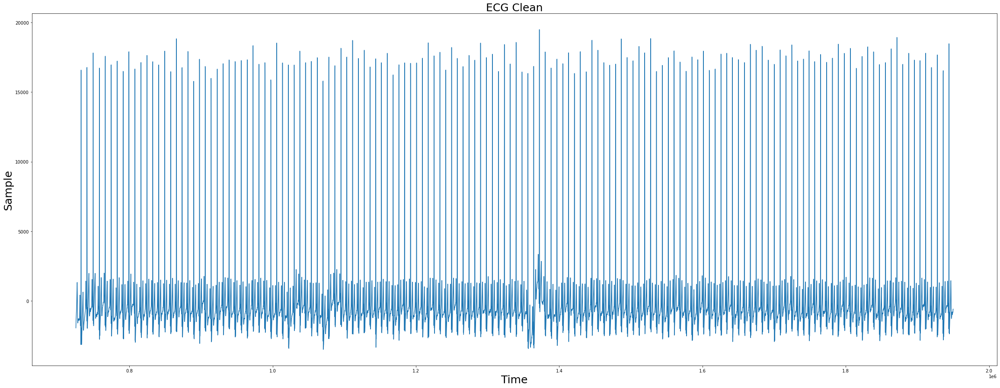

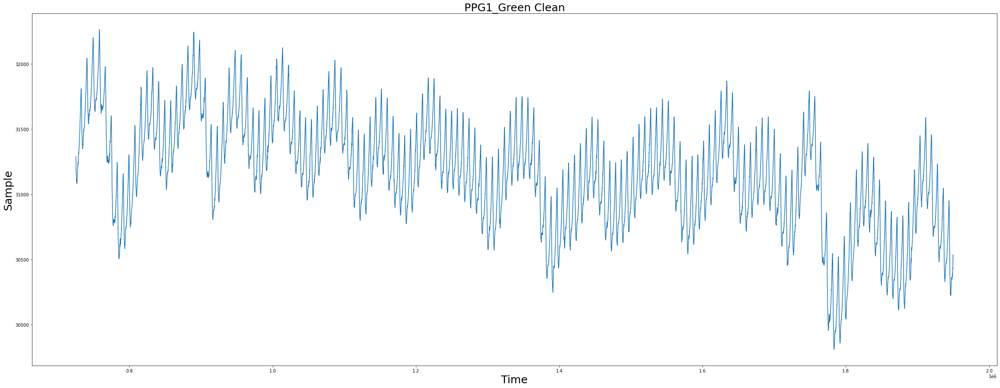

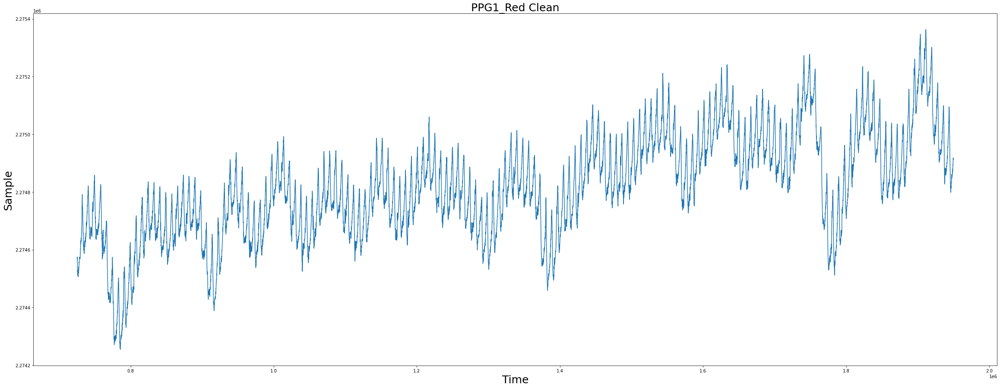

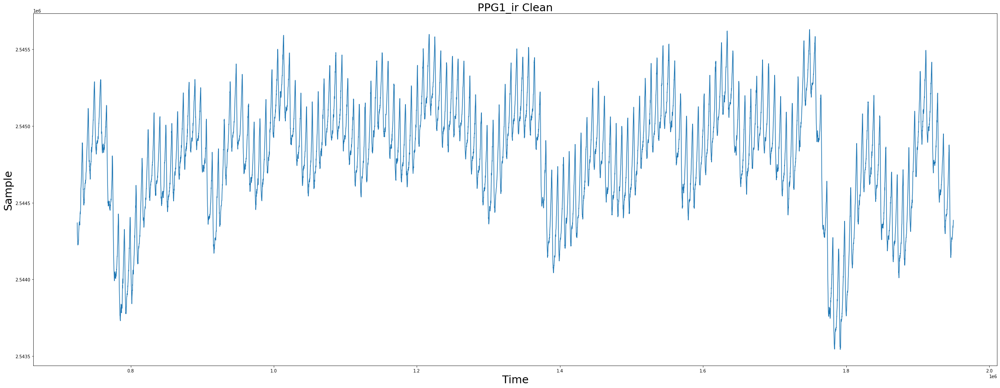

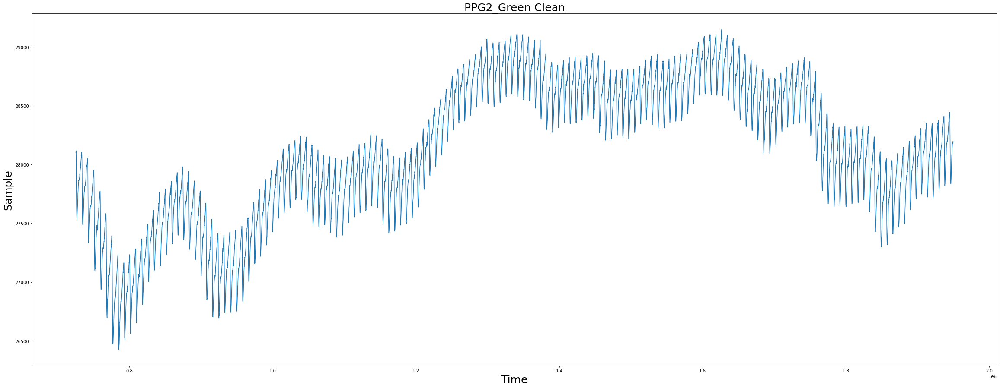

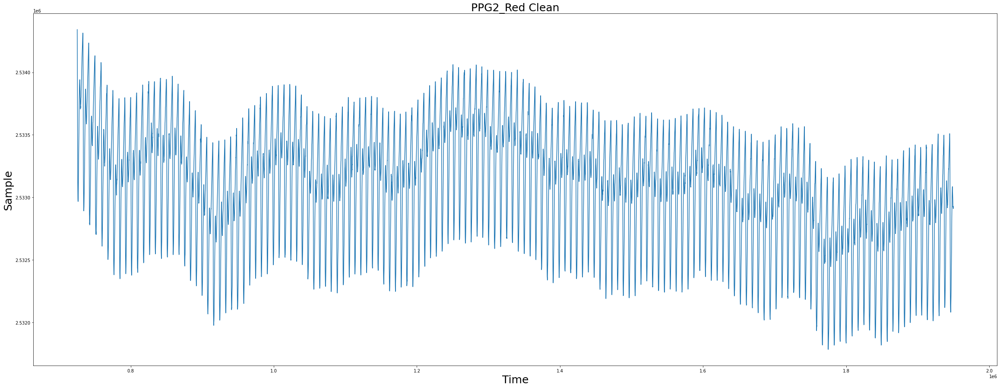

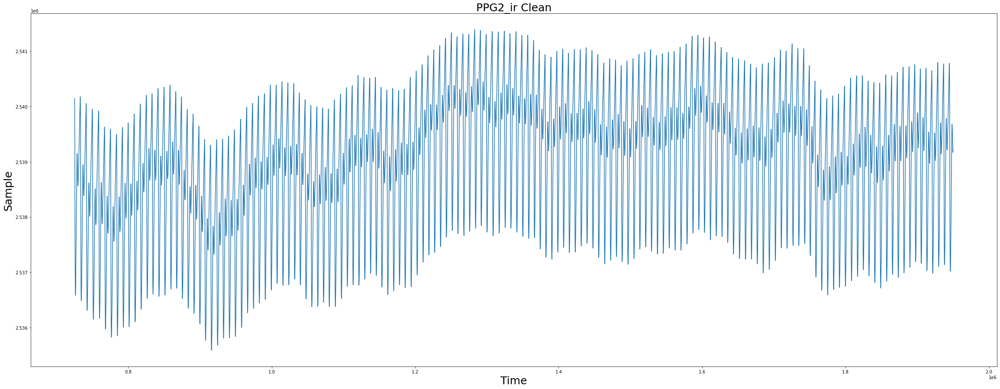

In [1067]:
#plot the data
x=clean_ecg['timestamps_ecg']
y=clean_ecg['ecg']


plt.figure(figsize=(40,15))
plt.title("ECG Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x,y)

x1=clean_ppg1['timestamps_ppg_1_green']
y1=clean_ppg1['ppg_1_green']


plt.figure(figsize=(40,15))
plt.title("PPG1_Green Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x1,y1)

x2=clean_ppg1['timestamps_ppg_1_red']
y2=clean_ppg1['ppg_1_red']


plt.figure(figsize=(40,15))
plt.title("PPG1_Red Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x2,y2)

x3=clean_ppg1['timestamps_ppg_1_ir']
y3=clean_ppg1['ppg_1_ir']


plt.figure(figsize=(40,15))
plt.title("PPG1_ir Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x3,y3)

x4=clean_ppg2['timestamps_ppg_2_green']
y4=clean_ppg2['ppg_2_green']


plt.figure(figsize=(40,15))
plt.title("PPG2_Green Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x4,y4)

x5=clean_ppg2['timestamps_ppg_2_red']
y5=clean_ppg2['ppg_2_red']


plt.figure(figsize=(40,15))
plt.title("PPG2_Red Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x5,y5)

x6=clean_ppg2['timestamps_ppg_2_ir']
y6=clean_ppg2['ppg_2_ir']


plt.figure(figsize=(40,15))
plt.title("PPG2_ir Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(x6,y6)

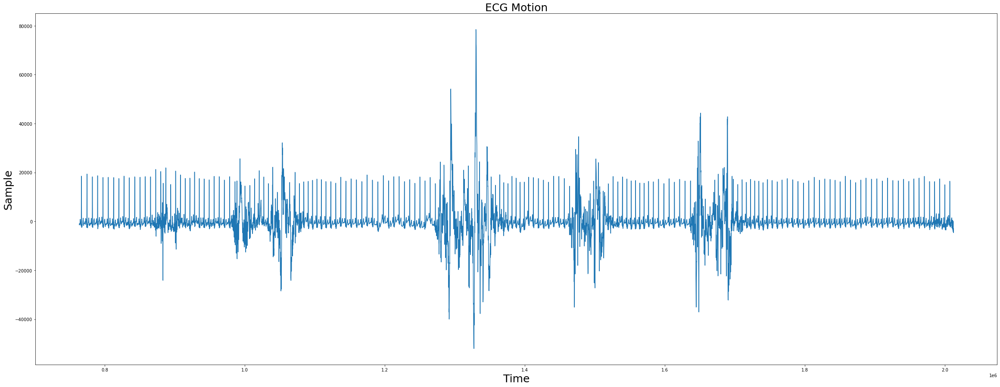

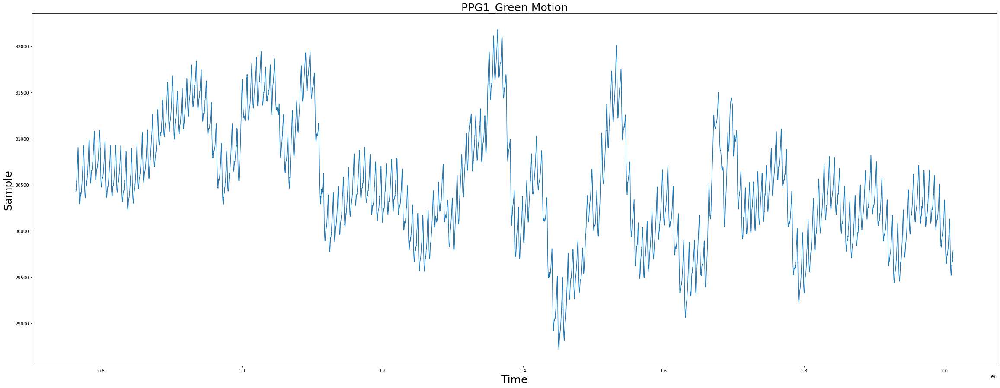

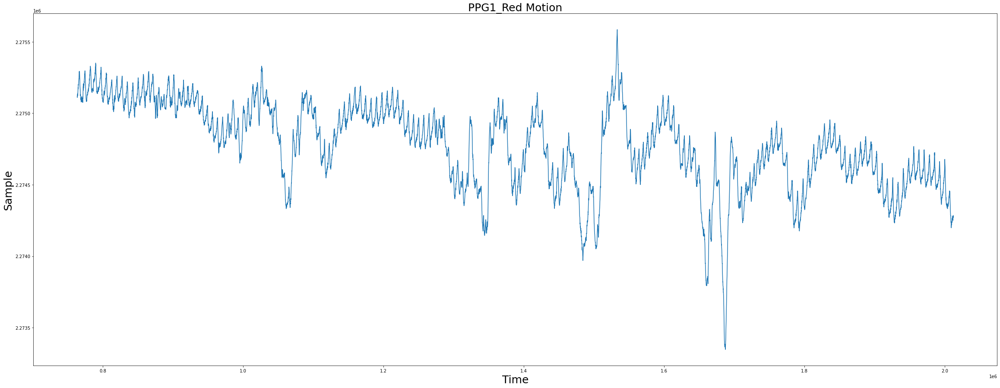

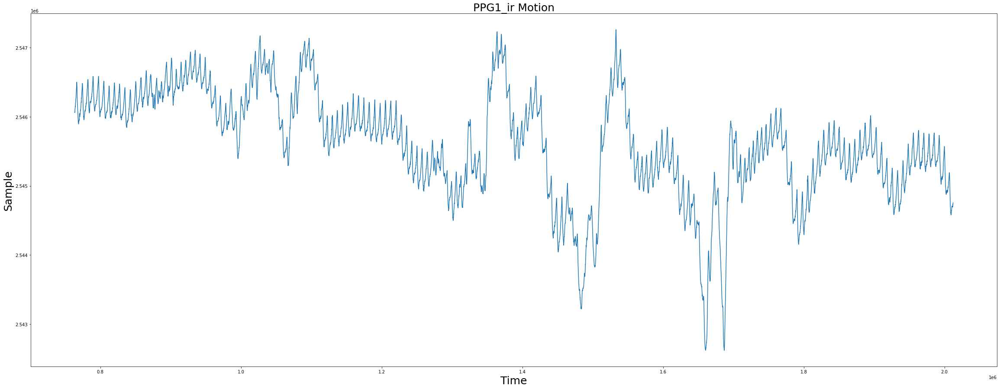

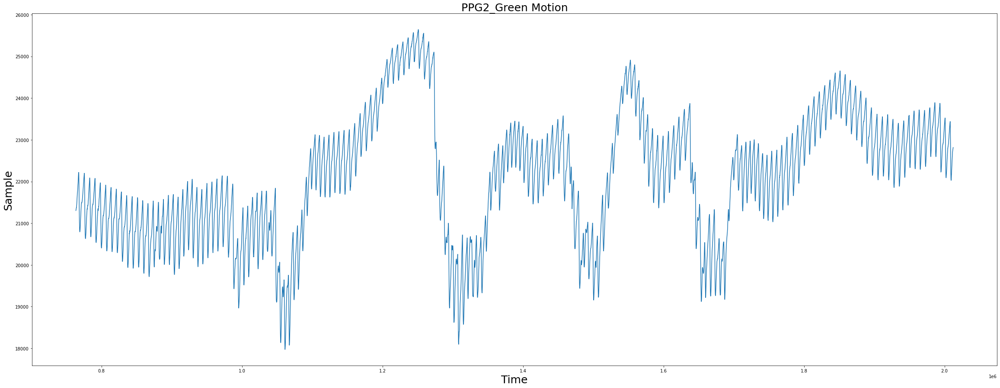

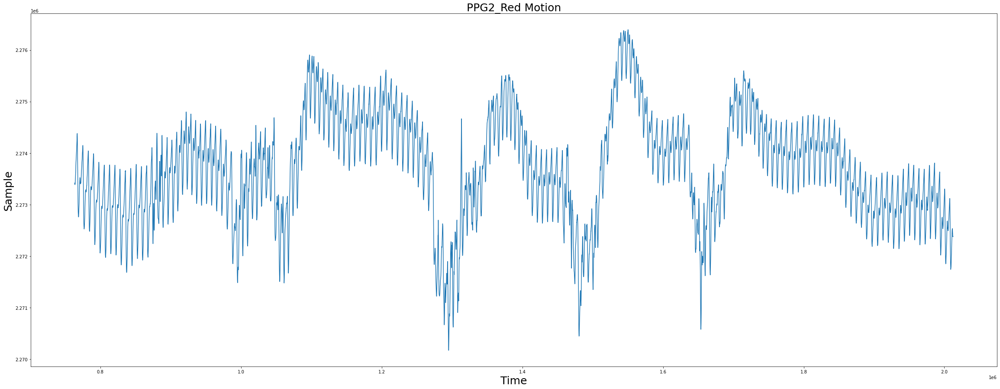

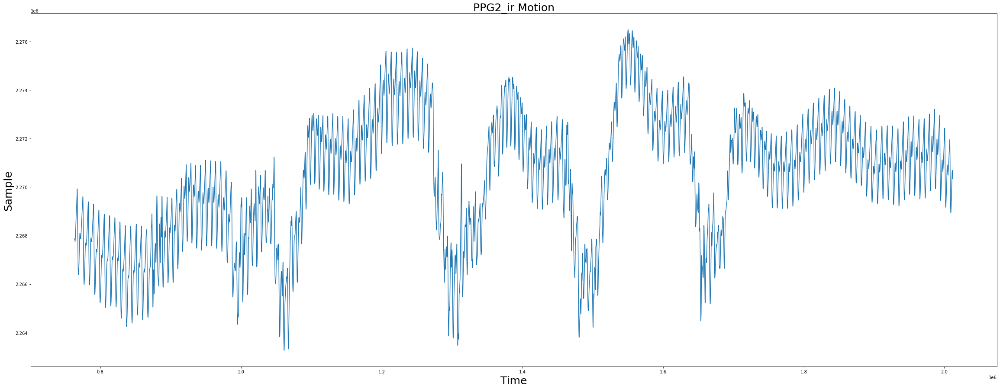

In [1068]:

a=motion_ecg['timestamps_ecg']
b=motion_ecg['ecg']


plt.figure(figsize=(40,15))
plt.title("ECG Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a,b)

a1=motion_ppg1['timestamps_ppg_1_green']
b1=motion_ppg1['ppg_1_green']


plt.figure(figsize=(40,15))
plt.title("PPG1_Green Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a1,b1)

a2=motion_ppg1['timestamps_ppg_1_red']
b2=motion_ppg1['ppg_1_red']


plt.figure(figsize=(40,15))
plt.title("PPG1_Red Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a2,b2)

a3=motion_ppg1['timestamps_ppg_1_ir']
b3=motion_ppg1['ppg_1_ir']


plt.figure(figsize=(40,15))
plt.title("PPG1_ir Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a3,b3)

a4=motion_ppg2['timestamps_ppg_2_green']
b4=motion_ppg2['ppg_2_green']


plt.figure(figsize=(40,15))
plt.title("PPG2_Green Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a4,b4)

a5=motion_ppg2['timestamps_ppg_2_red']
b5=motion_ppg2['ppg_2_red']


plt.figure(figsize=(40,15))
plt.title("PPG2_Red Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a5,b5)

a6=motion_ppg2['timestamps_ppg_2_ir']
b6=motion_ppg2['ppg_2_ir']


plt.figure(figsize=(40,15))
plt.title("PPG2_ir Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(a6,b6)

<br><br>2. Resample both signals so that they are the same length and samples are equidistant. Sample frequency should be easily adjusted as a variable. Use sampling frequency of 200 Hz. The original sampling frequency for ecg is 128 Hz and ppg = 100 Hz and length of the measurements are just over 2 mins.<br><br>


In [1069]:
#Clean

x = clean["timestamps_ecg"]
y = clean["ecg"]
x = x.dropna().to_numpy()
y = y.dropna().to_numpy()

x1 = clean["timestamps_ppg_1_green"]
y1 = clean["ppg_1_green"]
x1 = x1.dropna().to_numpy()
y1 = y1.dropna().to_numpy()

x2 = clean["timestamps_ppg_1_red"]
y2 = clean["ppg_1_red"]
x2 = x2.dropna().to_numpy()
y2 = y2.dropna().to_numpy()

x3 = clean["timestamps_ppg_1_ir"]
y3 = clean["ppg_1_ir"]
x3 = x3.dropna().to_numpy()
y3 = y3.dropna().to_numpy()

x4 = clean["timestamps_ppg_2_green"]
y4 = clean["ppg_2_green"]
x4 = x4.dropna().to_numpy()
y4 = y4.dropna().to_numpy()

x5 = clean["timestamps_ppg_2_red"]
y5 = clean["ppg_2_red"]
x5 = x5.dropna().to_numpy()
y5 = y5.dropna().to_numpy()

x6 = clean["timestamps_ppg_2_ir"]
y6 = clean["ppg_2_ir"]
x6 = x6.dropna().to_numpy()
y6 = y6.dropna().to_numpy()


In [1070]:
#Motion

a = motion["timestamps_ecg"]
b = motion["ecg"]
a = a.dropna().to_numpy()
b = b.dropna().to_numpy()

a1 = motion["timestamps_ppg_1_green"]
b1 = motion["ppg_1_green"]
a1 = a1.dropna().to_numpy()
b1 = b1.dropna().to_numpy()

a2 = motion["timestamps_ppg_1_red"]
b2 = motion["ppg_1_red"]
a2 = a2.dropna().to_numpy()
b2 = b2.dropna().to_numpy()

a3 = motion["timestamps_ppg_1_ir"]
b3 = motion["ppg_1_ir"]
a3 = a3.dropna().to_numpy()
b3 = b3.dropna().to_numpy()

a4 = motion["timestamps_ppg_2_green"]
b4 = motion["ppg_2_green"]
a4 = a4.dropna().to_numpy()
b4 = b4.dropna().to_numpy()

a5 = motion["timestamps_ppg_2_red"]
b5 = motion["ppg_2_red"]
a5 = a5.dropna().to_numpy()
b5 = b5.dropna().to_numpy()

a6 = motion["timestamps_ppg_2_ir"]
b6 = motion["ppg_2_ir"]
a6 = a6.dropna().to_numpy()
b6 = b6.dropna().to_numpy()


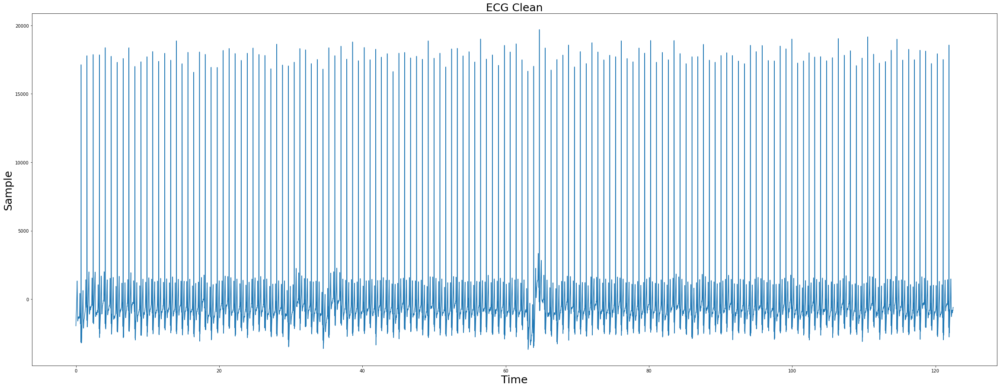

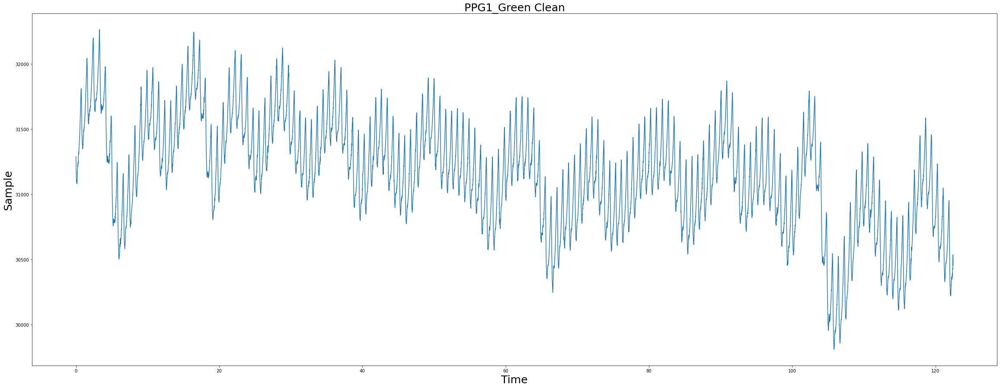

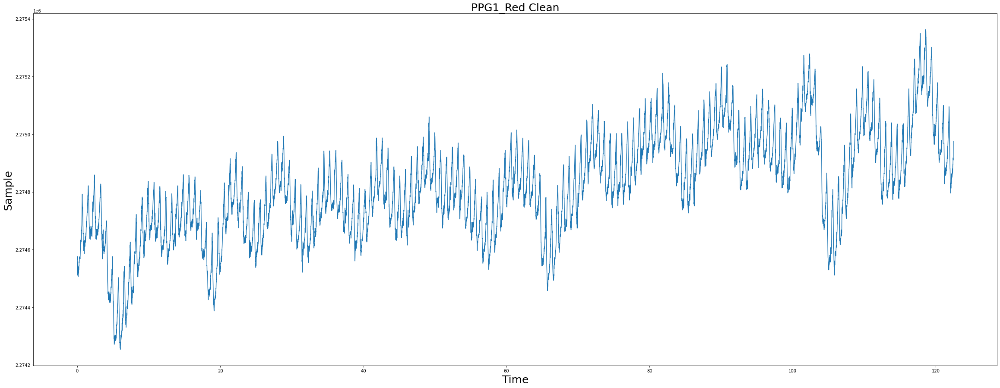

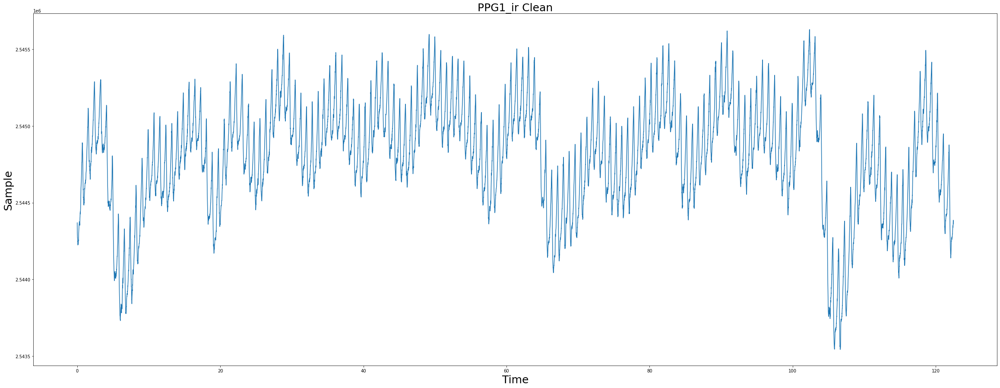

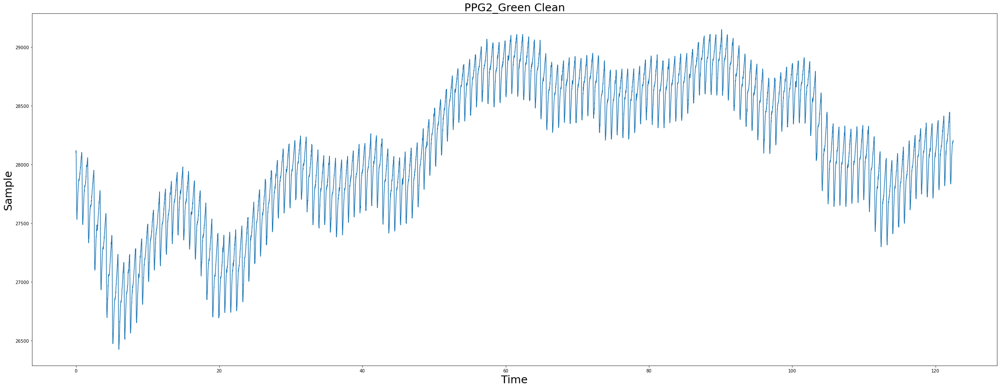

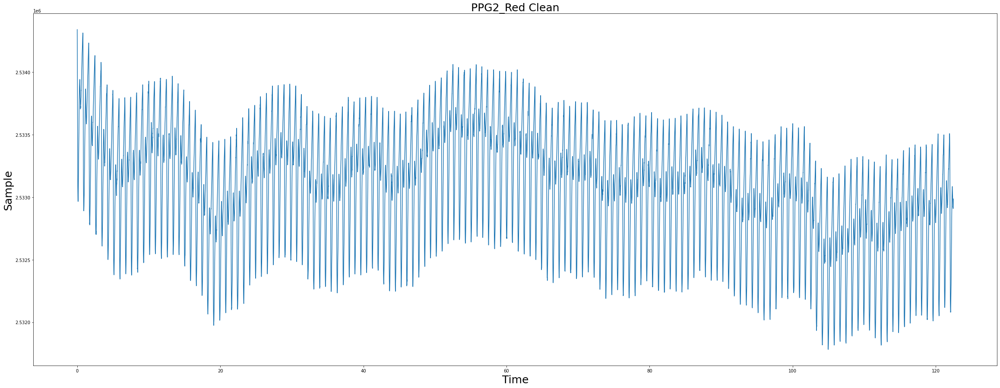

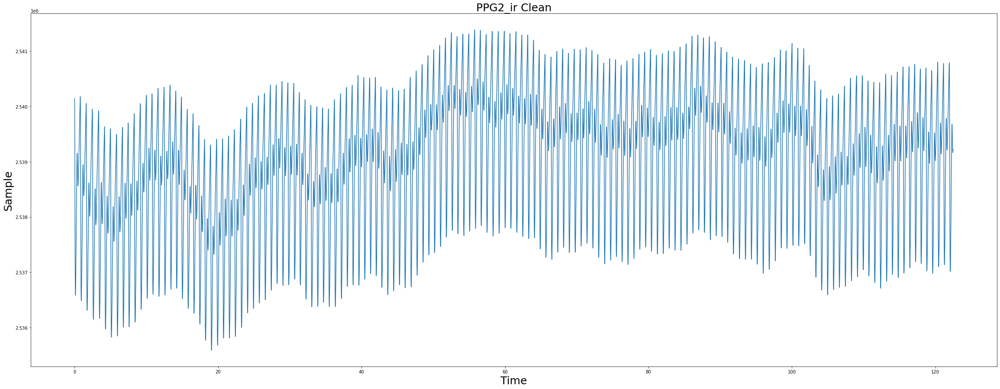

In [1071]:
cleant_new=[0, 0, 0, 0, 0, 0, 0]

for i,j in enumerate([x,x1,x2,x3,x4,x5,x6]):
    cleant_new[i] = np.linspace(0,(np.max(j)-np.min(j))/10**4,len(j)*200)



f = interpolate.interp1d((x-np.min(x))/10000, y, kind='cubic', fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("ECG Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f(cleant_new[0]))

f1 = interpolate.interp1d((x1-np.min(x1))/10000, y1, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_Green Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f1(cleant_new[0]))


f2 = interpolate.interp1d((x2-np.min(x2))/10000, y2, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_Red Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f2(cleant_new[0]))


f3 = interpolate.interp1d((x3-np.min(x3))/10000, y3, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_ir Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f3(cleant_new[0]))


f4 = interpolate.interp1d((x4-np.min(x4))/10000, y4, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_Green Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f4(cleant_new[0]))


f5 = interpolate.interp1d((x5-np.min(x5))/10000, y5, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_Red Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(cleant_new[0],f5(cleant_new[0]))


f6 = interpolate.interp1d((x6-np.min(x6))/10000, y6, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_ir Clean",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(new_time_clean[0],f6(new_time_clean[0]))

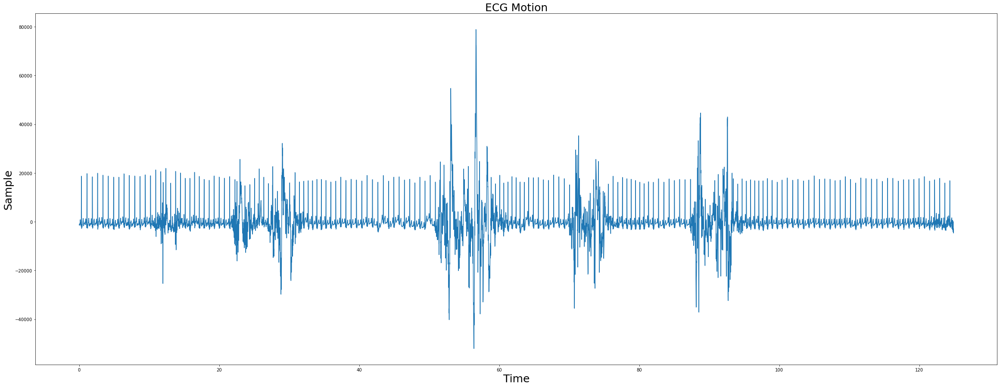

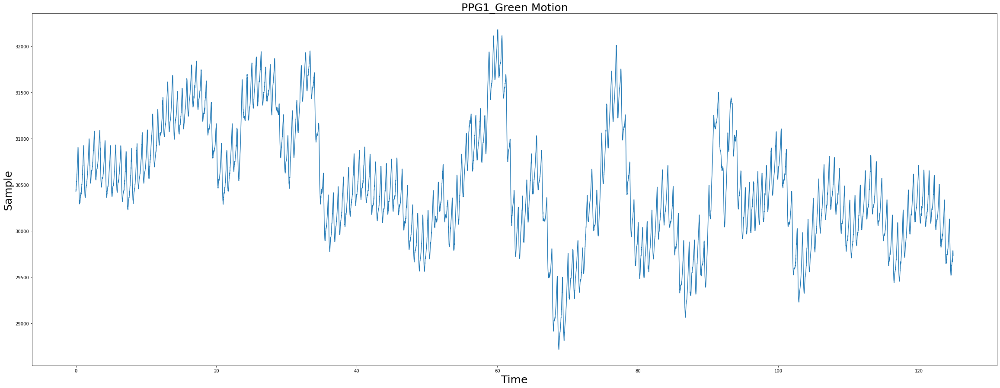

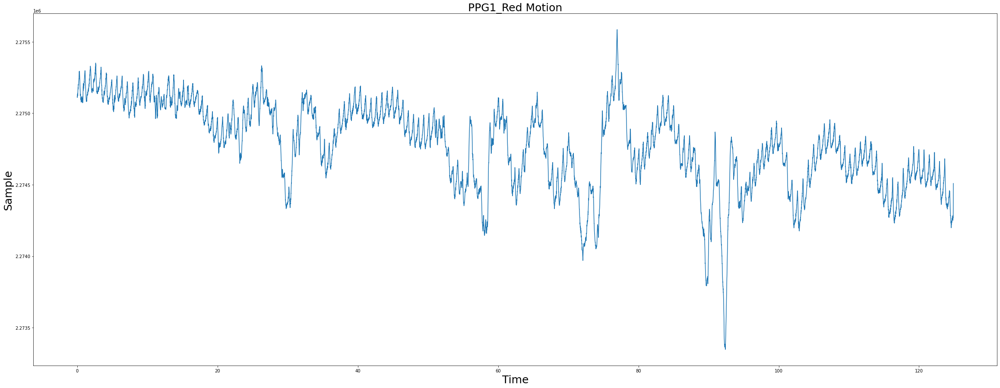

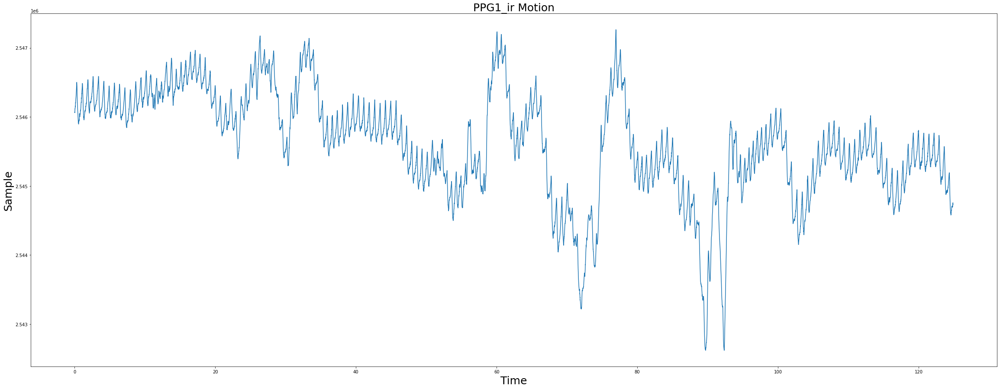

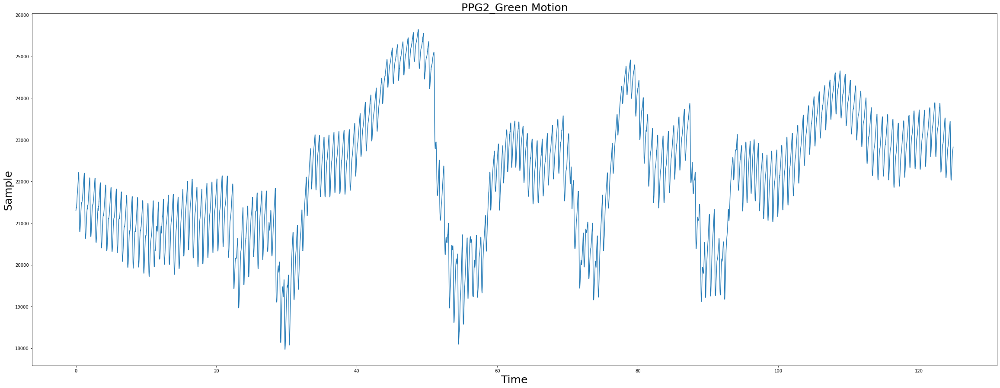

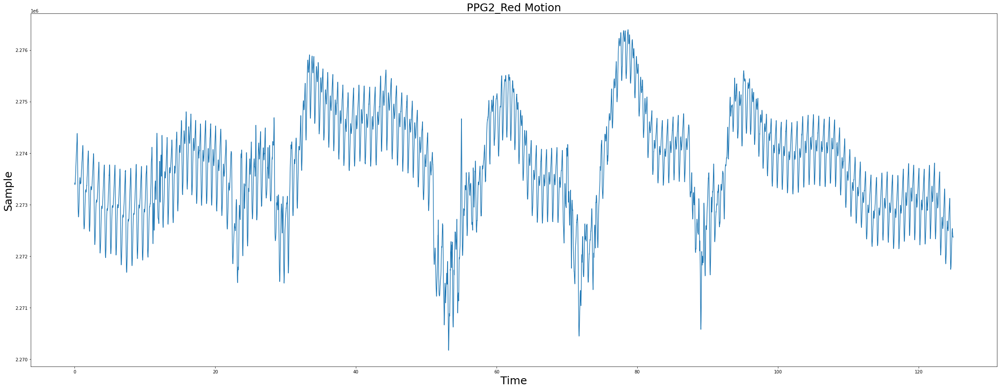

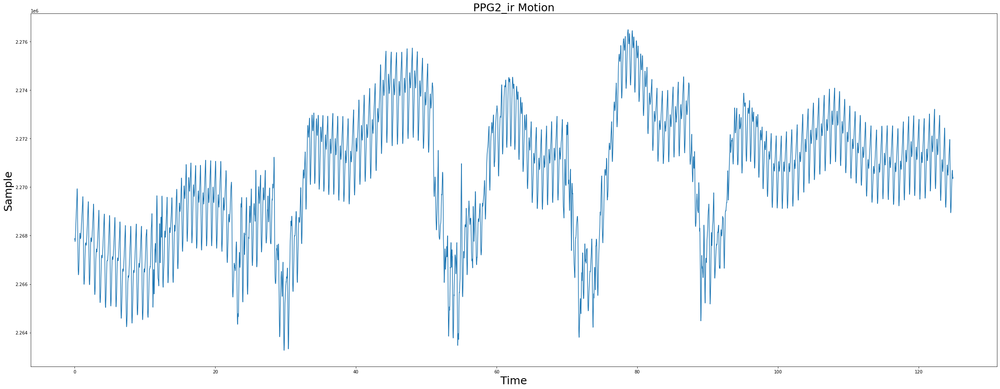

In [1072]:
tmot_new=[0, 0, 0, 0, 0, 0, 0]

for i,j in enumerate([a,a1,a2,a3,a4,a5,a6]):
    tmot_new[i] = np.linspace(0,(np.max(j)-np.min(j))/10**4,len(j)*200)



f = interpolate.interp1d((a-np.min(a))/10000, b, kind='cubic', fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("ECG Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f(tmot_new[0]))

f1 = interpolate.interp1d((a1-np.min(a1))/10000, b1, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_Green Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f1(tmot_new[0]))


f2 = interpolate.interp1d((a2-np.min(a2))/10000, b2, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_Red Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f2(tmot_new[0]))


f3 = interpolate.interp1d((a3-np.min(a3))/10000, b3, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG1_ir Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f3(tmot_new[0]))


f4 = interpolate.interp1d((a4-np.min(a4))/10000, b4, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_Green Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f4(tmot_new[0]))


f5 = interpolate.interp1d((a5-np.min(a5))/10000, b5, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_Red Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f5(tmot_new[0]))


f6 = interpolate.interp1d((a6-np.min(a6))/10000, b6, kind='cubic',fill_value="extrapolate")
plt.figure(figsize=(40,15))
plt.title("PPG2_ir Motion",fontsize=25)
plt.xlabel("Time",fontsize=25)
plt.ylabel("Sample",fontsize=25)
plt.plot(tmot_new[0],f6(tmot_new[0]))

<br><br>3. Visualize the signals in frequency domain. Does it look as expected (compare to frequencies that you expected to see from time domain inspection)? Which frequency band carries most of the information? (hint: fft or welch)<br><br>


<Figure size 432x288 with 0 Axes>

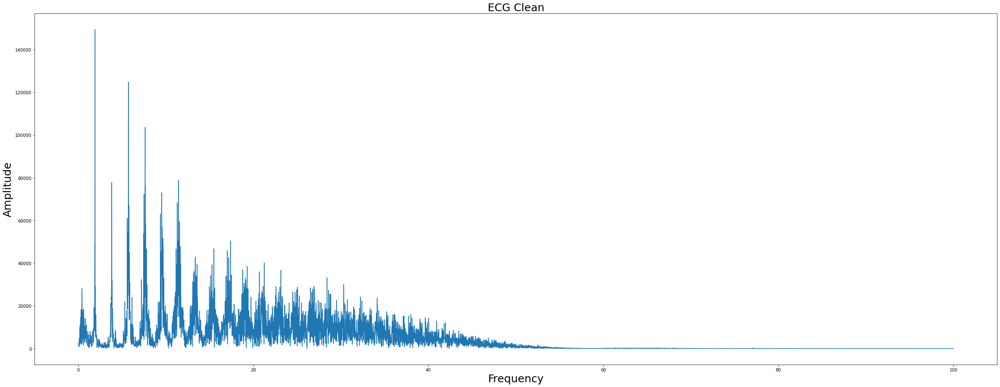

In [1073]:
f = interpolate.interp1d((x-np.min(x))/10000, y, kind='cubic')
N = len(y)
T = 1 / 200
x_0 = np.linspace(0, N * T, N)
y_0 = f(cleant_new[0])
yf = sp.fftpack.fft(y_0)
xf = np.linspace(0, 1/(2 * T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("ECG Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()








<Figure size 432x288 with 0 Axes>

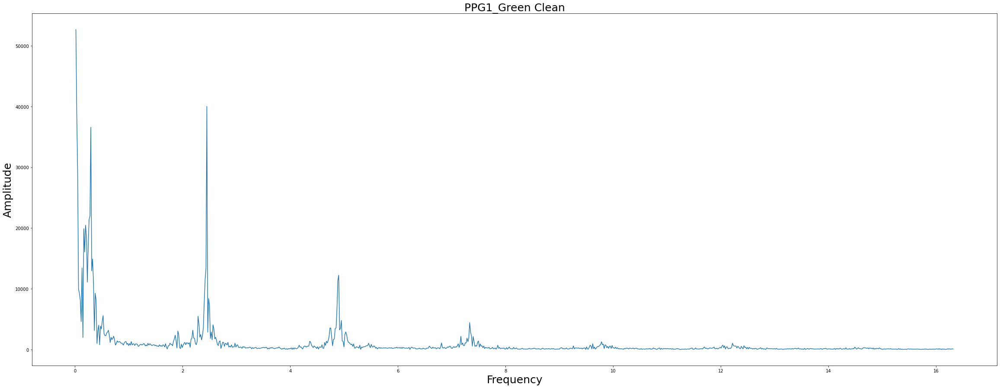

In [1074]:
f = interpolate.interp1d((x1-np.min(x1))/10000, y1, kind='cubic')

N = len(y1)
T = 1 / 200
x_1 = np.linspace(0, N*T, N)
y_1 = f(cleant_new[1])
yf = sp.fftpack.fft(y_1)
xf = np.linspace(0, 1/(2 * T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_Green Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()


<Figure size 432x288 with 0 Axes>

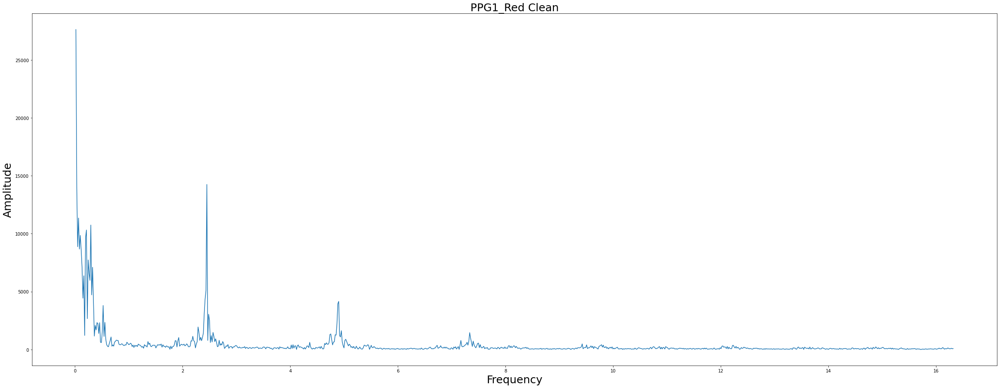

In [1075]:
f = interpolate.interp1d((x2-np.min(x2))/10000, y2, kind='cubic')
N = len(y2)
T = 1 / 200
x_2 = np.linspace(0, N*T, N)
y_2 = f(cleant_new[2])
yf = sp.fftpack.fft(y_2)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_Red Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()

<Figure size 432x288 with 0 Axes>

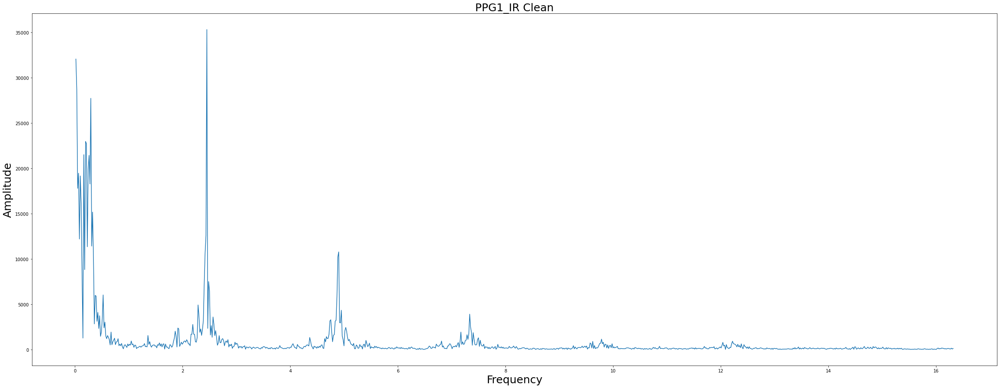

In [1076]:
f = interpolate.interp1d((x3-np.min(x3))/10000, y3, kind='cubic')
N = len(y3)
T = 1 / 200
x_3 = np.linspace(0, N*T, N)
y_3 = f(cleant_new[3])
yf = sp.fftpack.fft(y_3)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_IR Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()

<Figure size 432x288 with 0 Axes>

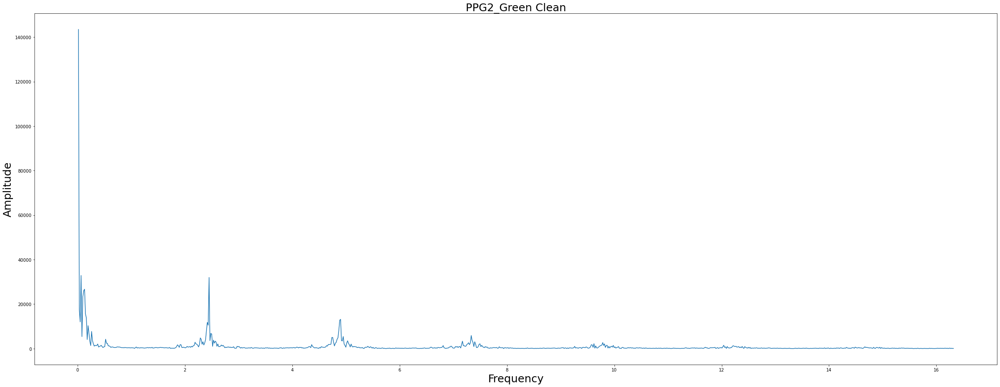

In [1077]:
f = interpolate.interp1d((x4-np.min(x4))/10000, y4, kind='cubic')
N = len(y4)
T = 1 / 200
x_4 = np.linspace(0, N*T, N)
y_4 = f(cleant_new[4])
yf = sp.fftpack.fft(y_4)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_Green Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()

<Figure size 432x288 with 0 Axes>

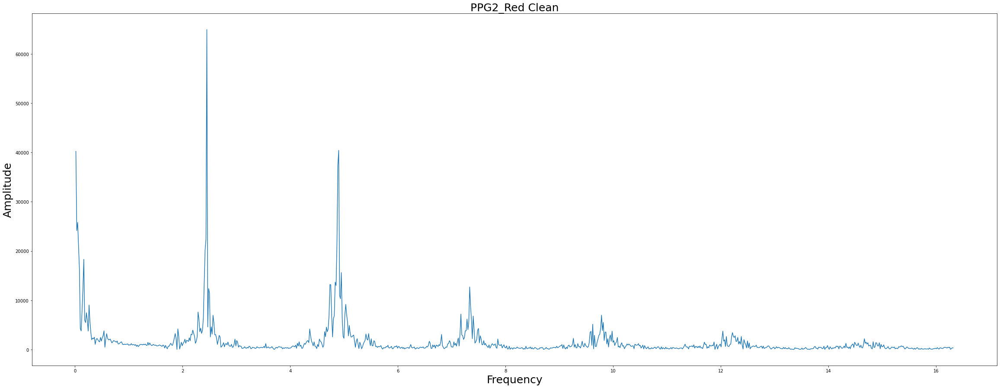

In [1078]:
f = interpolate.interp1d((x5-np.min(x5))/10000, y5, kind='cubic')
N = len(y5)
T = 1 / 200
x_5 = np.linspace(0, N*T, N)
y_5 = f(cleant_new[5])
yf = sp.fftpack.fft(y_5)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_Red Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()

<Figure size 432x288 with 0 Axes>

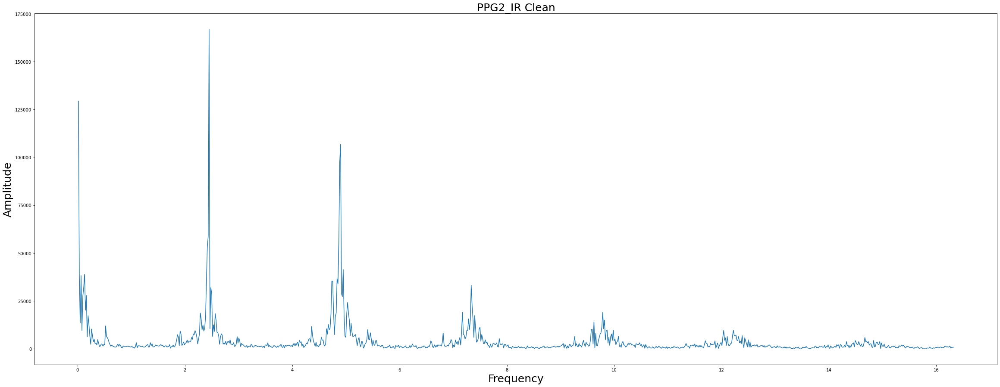

In [1079]:
f = interpolate.interp1d((x6-np.min(x6))/10000, y6, kind='cubic')
N = len(y6)
T = 1 / 200
x_6 = np.linspace(0, N*T, N)
y_6 = f(cleant_new[6])
yf = sp.fftpack.fft(y_6)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_IR Clean",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:1000], (2/N * np.abs(yf[0:int(N/2)]))[1:1000])
plt.show()

<Figure size 432x288 with 0 Axes>

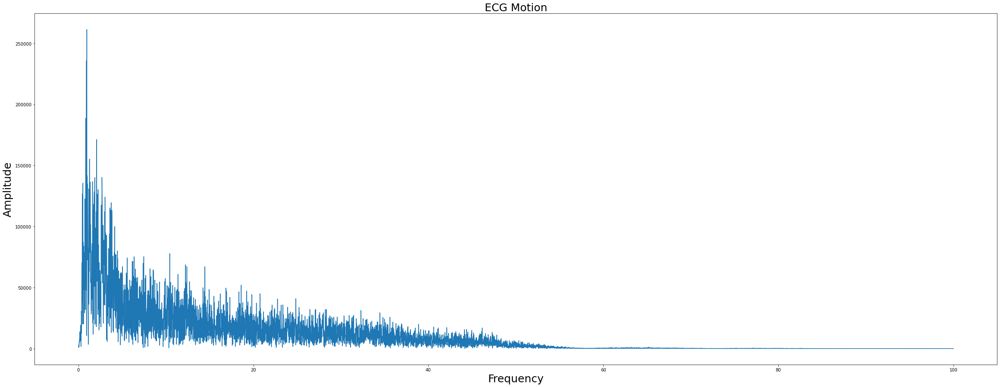

In [1080]:
f = interpolate.interp1d((a-np.min(a))/10000, b, kind='cubic')
N = len(b)
T = 1 / 200
a_0 = np.linspace(0.0, N*T, N)
b_0 = f(tmot_new[0])
yf = sp.fftpack.fft(b_0)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("ECG Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

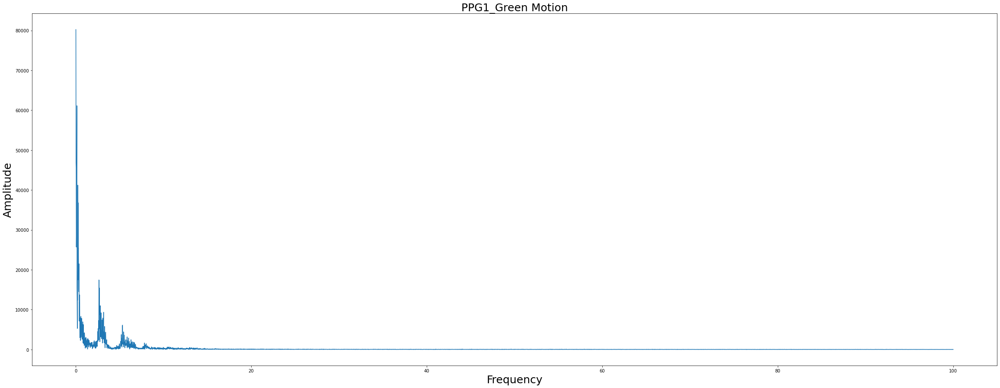

In [1081]:
f = interpolate.interp1d((a1-np.min(a1))/10000, b1, kind='cubic',fill_value="extrapolate")
N = len(b1)
T = 1 / 200
a_1 = np.linspace(0, N*T, N)
b_1 = f(tmot_new[1])
yf = sp.fftpack.fft(b_1)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_Green Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

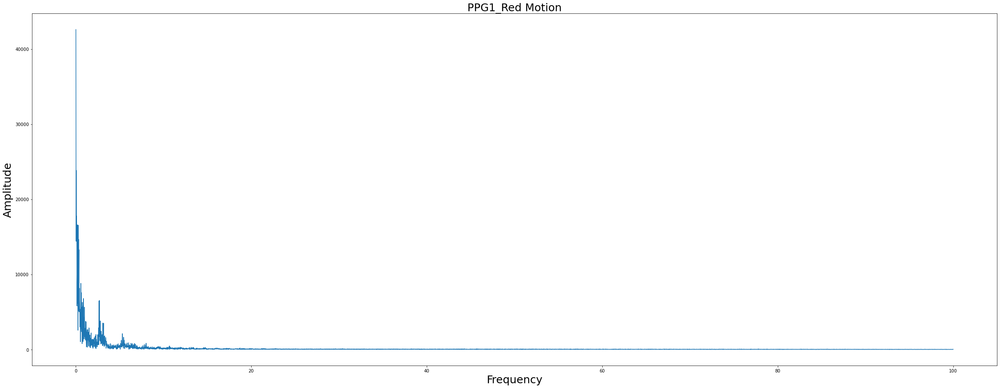

In [1082]:
f = interpolate.interp1d((a2-np.min(a2))/10000, b2, kind='cubic',fill_value="extrapolate")
N = len(b2)
T = 1 / 200
a_2 = np.linspace(0, N*T, N)
b_2 = f(tmot_new[2])
yf = sp.fftpack.fft(b_2)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_Red Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

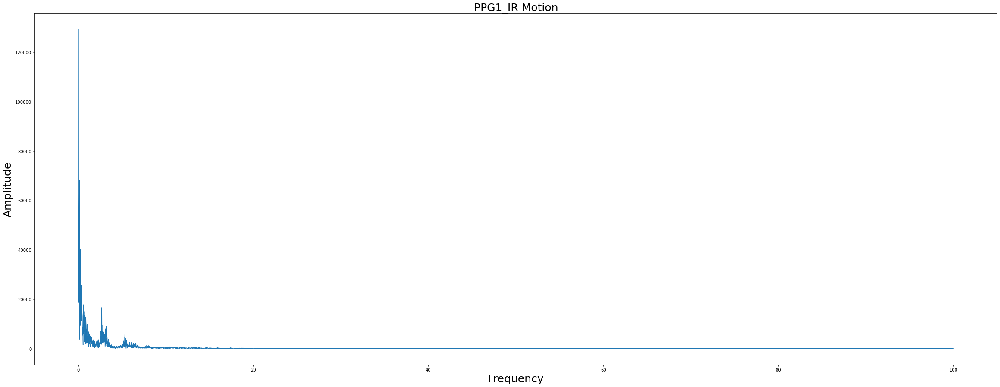

In [1083]:
f = interpolate.interp1d((a3-np.min(a3))/10000, b3, kind='cubic',fill_value="extrapolate")
N = len(b3)
T = 1 / 200
a_3 = np.linspace(0, N*T, N)
b_3 = f(tmot_new[3])
yf = sp.fftpack.fft(b_3)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG1_IR Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

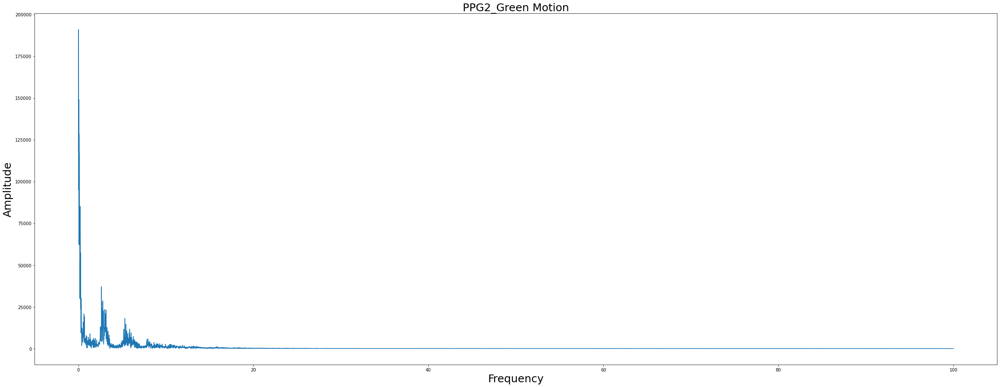

In [1084]:
f = interpolate.interp1d((a4-np.min(a4))/10000, b4, kind='cubic',fill_value="extrapolate")
N = len(b4)
T = 1 / 200
a_4 = np.linspace(0, N*T, N)
b_4 = f(tmot_new[4])
yf = sp.fftpack.fft(b_4)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_Green Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

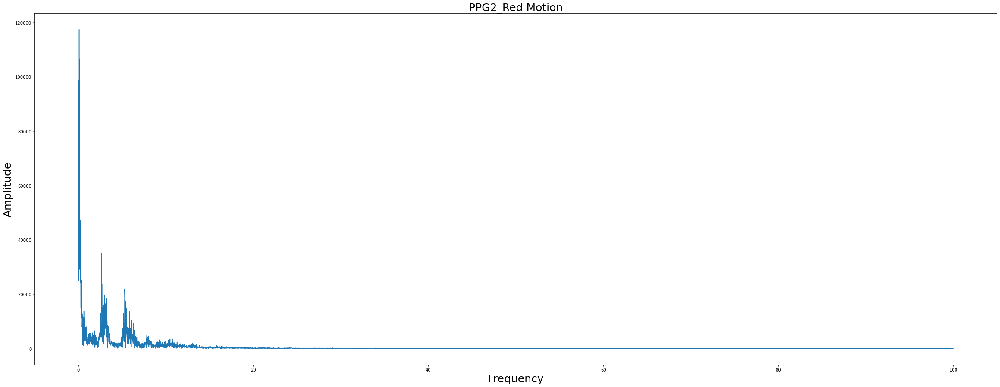

In [1085]:
f = interpolate.interp1d((a5-np.min(a5))/10000, b5, kind='cubic',fill_value="extrapolate")
N = len(b5)
T = 1 / 200
a_5 = np.linspace(0.0, N*T, N)
b_5 = f(tmot_new[5])
yf = sp.fftpack.fft(b_5)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_Red Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<Figure size 432x288 with 0 Axes>

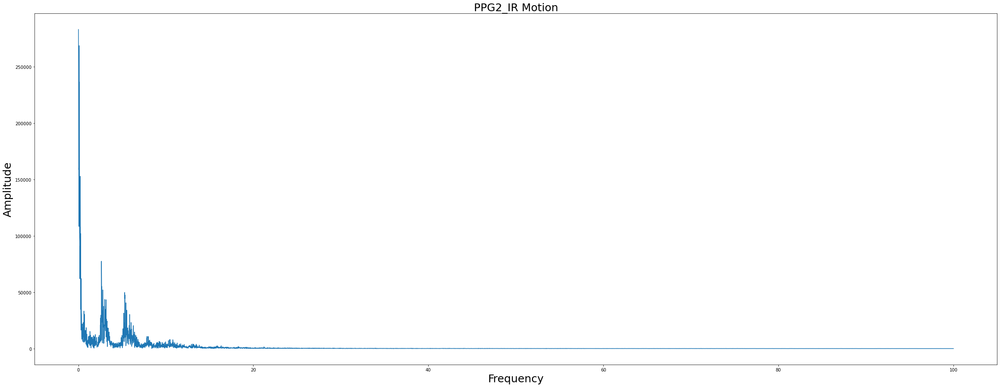

In [1086]:
f = interpolate.interp1d((a6-np.min(a6))/10000, b6, kind='cubic',fill_value="extrapolate")
N = len(b6)
T = 1 / 200
a_6 = np.linspace(0, N*T, N)
b_6 = f(tmot_new[6])
yf = sp.fftpack.fft(b_6)
xf = np.linspace(0, 1/(2*T), int(N/2))

plt.figure()
plt.figure(figsize=(40,15))
plt.title("PPG2_IR Motion",fontsize=25)
plt.xlabel("Frequency",fontsize=25)
plt.ylabel("Amplitude",fontsize=25)
plt.plot(xf[1:], (2/N * np.abs(yf[0:int(N/2)]))[1:])
plt.show()

<br>Welch:<br>


Dominant frequency of clean ECG:   [0.78125]

Dominant frequency of clean PPG1_Green:  [0.78125]

Dominant frequency of clean PPG1_Red: [0.78125]

Dominant frequency of clean PPG1_IR:  [0.78125]

Dominant frequency of clean PPG2_Green:  [0.78125]

Dominant frequency of clean PPG2_Red:  [0.78125]

Dominant frequency of clean PPG2_IR:  [0.78125]


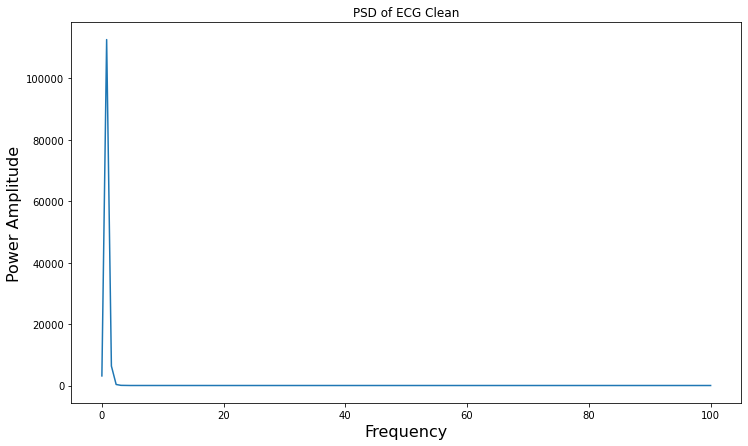

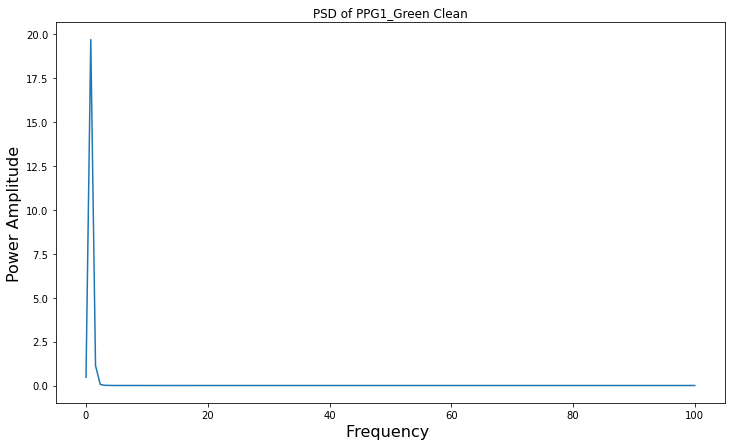

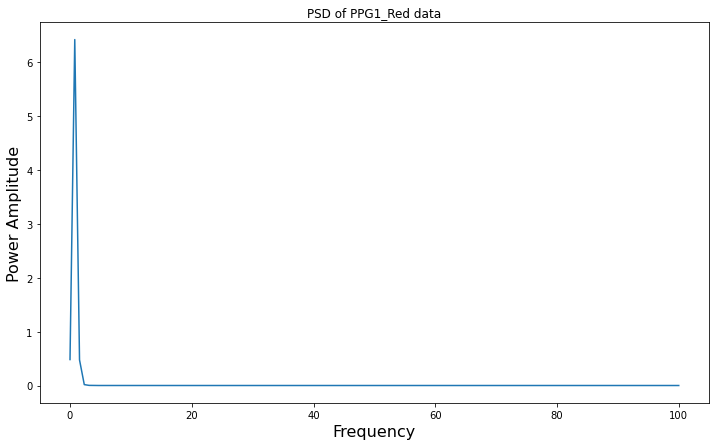

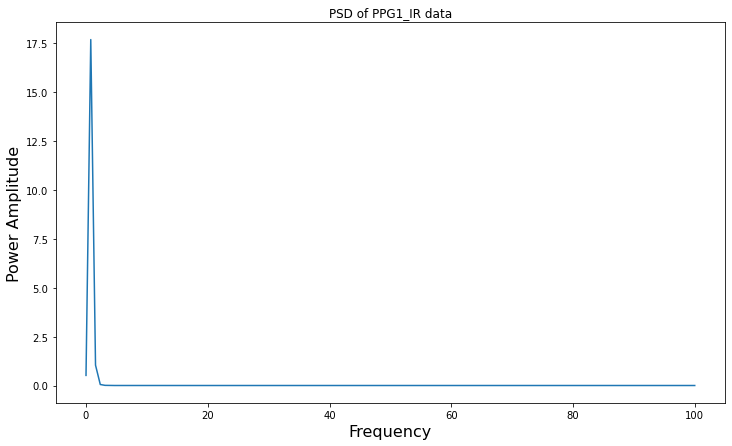

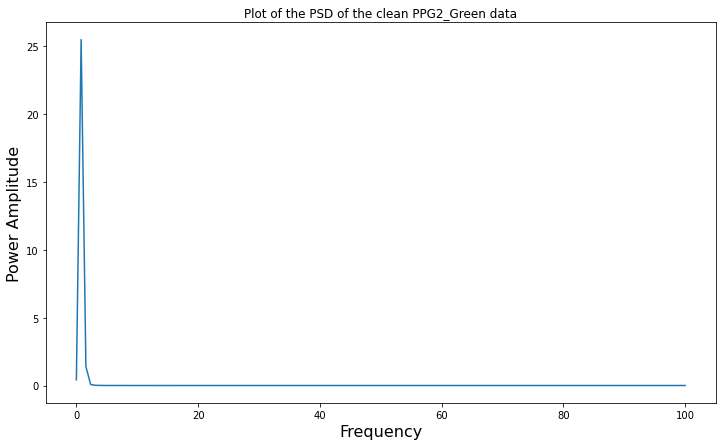

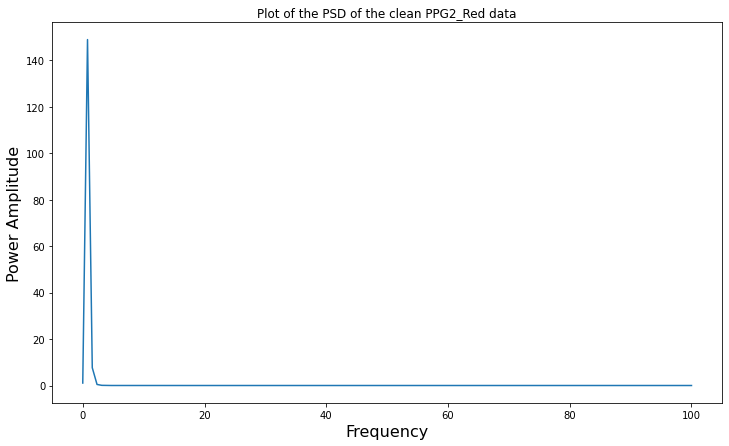

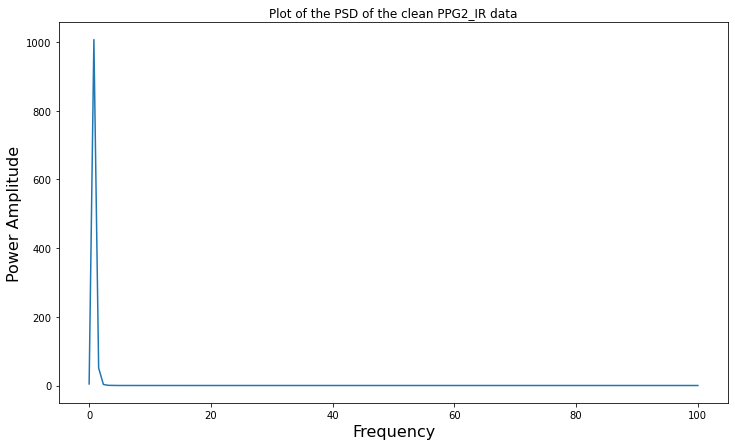

In [1087]:
fs=200
f = interpolate.interp1d((x-np.min(x))/10000, y, kind='cubic')
PSD_freqs,PSD = sp.signal.welch(f(cleant_new[0]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of ECG Clean")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs,PSD)

dom_freq = PSD_freqs[np.where(PSD == max(PSD))]
print("\nDominant frequency of clean ECG:  ",dom_freq)




f1 = interpolate.interp1d((x1-np.min(x1))/10000, y1, kind='cubic')
PSD_freqs1,PSD1 = sp.signal.welch(f1(cleant_new[1]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_Green Clean")
plt.xlabel("Frequency ",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs1,PSD1)

dom_freq1 = PSD_freqs1[np.where(PSD1 == max(PSD1))]
print("\nDominant frequency of clean PPG1_Green: ",dom_freq1)




f2 = interpolate.interp1d((x2-np.min(x2))/10000, y2, kind='cubic')
PSD_freqs2,PSD2 = sp.signal.welch(f2(cleant_new[2]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_Red data")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs2,PSD2)

dom_freq2 = PSD_freqs2[np.where(PSD2 == max(PSD2))]
print("\nDominant frequency of clean PPG1_Red:",dom_freq2)




f3 = interpolate.interp1d((x3-np.min(x3))/10000, y3, kind='cubic')
PSD_freqs3,PSD3 = sp.signal.welch(f3(cleant_new[3]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_IR data")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs3,PSD3)

dom_freq3 = PSD_freqs3[np.where(PSD3 == max(PSD3))]
print("\nDominant frequency of clean PPG1_IR: ",dom_freq3)




f4 = interpolate.interp1d((x4-np.min(x4))/10000, y4, kind='cubic')
PSD_freqs4,PSD4 = sp.signal.welch(f4(cleant_new[4]),fs)

plt.figure(figsize=(12,7))
plt.title("Plot of the PSD of the clean PPG2_Green data")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs4,PSD4)

dom_freq4 = PSD_freqs4[np.where(PSD4 == max(PSD4))]
print("\nDominant frequency of clean PPG2_Green: ",dom_freq4)




f5 = interpolate.interp1d((x5-np.min(x5))/10000, y5, kind='cubic')
PSD_freqs5,PSD5 = sp.signal.welch(f5(cleant_new[5]),fs)

plt.figure(figsize=(12,7))
plt.title("Plot of the PSD of the clean PPG2_Red data")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs5,PSD5)

dom_freq5 = PSD_freqs5[np.where(PSD5 == max(PSD5))]
print("\nDominant frequency of clean PPG2_Red: ",dom_freq5)





f6 = interpolate.interp1d((x6-np.min(x6))/10000, y6, kind='cubic')
PSD_freqs6,PSD6 = sp.signal.welch(f6(cleant_new[6]),fs)

plt.figure(figsize=(12,7))
plt.title("Plot of the PSD of the clean PPG2_IR data")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs6,PSD6)

dom_freq6 = PSD_freqs6[np.where(PSD6 == max(PSD6))]
print("\nDominant frequency of clean PPG2_IR: ",dom_freq6)







Dominant frequency of motion ECG:   [0.78125]

Dominant frequency of motion PPG1_Green :   [0.78125]

Dominant frequency of motion PPG1_Red:   [0.78125]

Dominant frequency of motion PPG1_IR:   [0.78125]

Dominant frequency of motion PPG2_Green:   [0.78125]

Dominant frequency of motion PPG2_Red:   [0.78125]

Dominant frequency of motion PPG2_IR:   [0.78125]


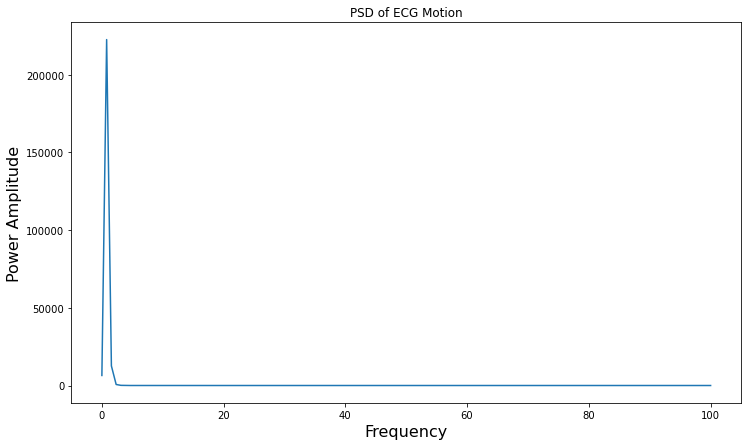

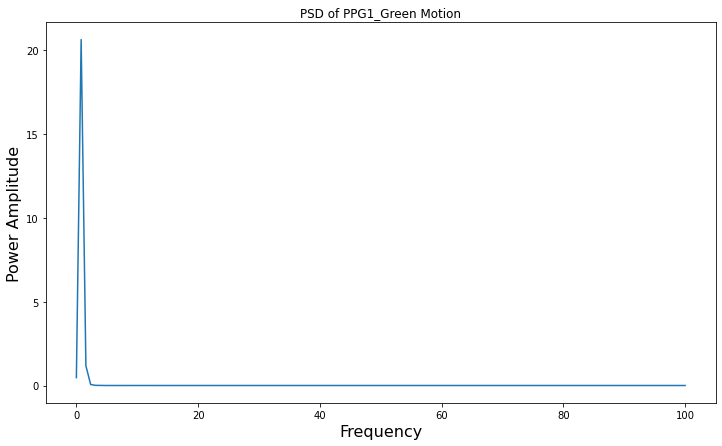

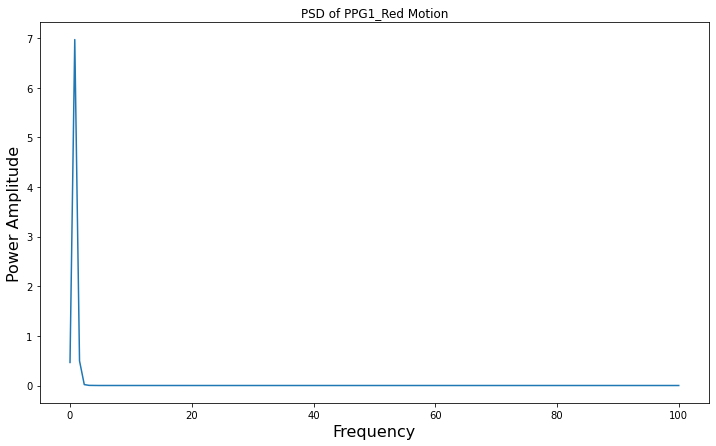

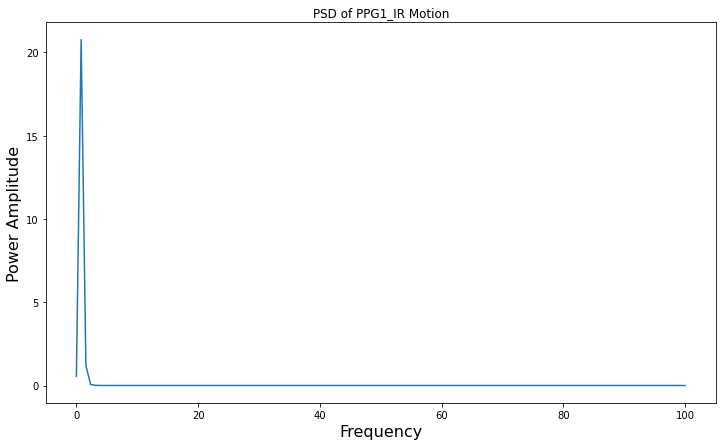

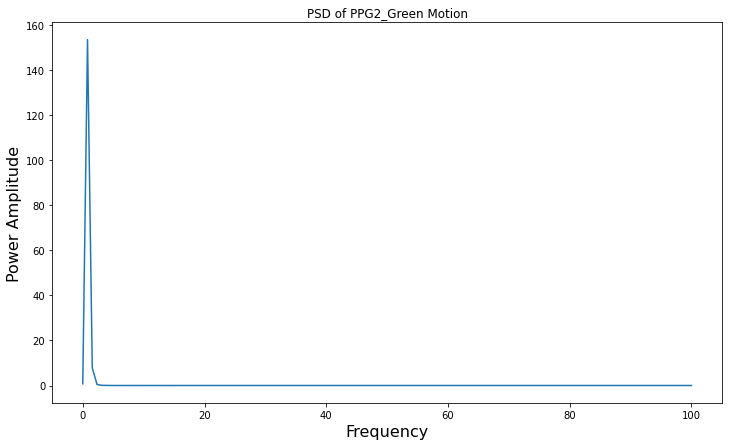

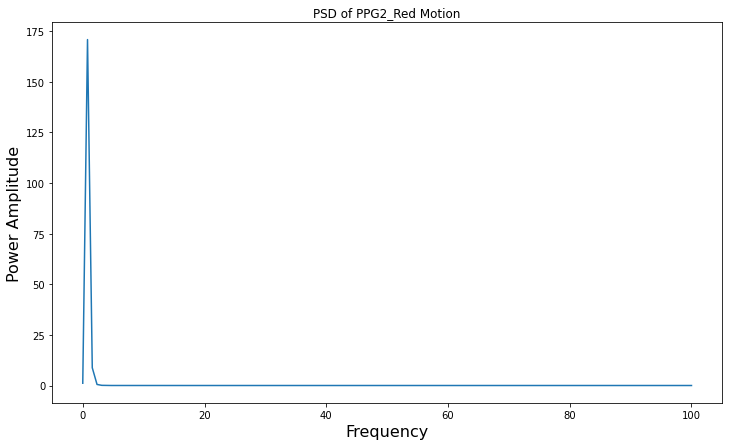

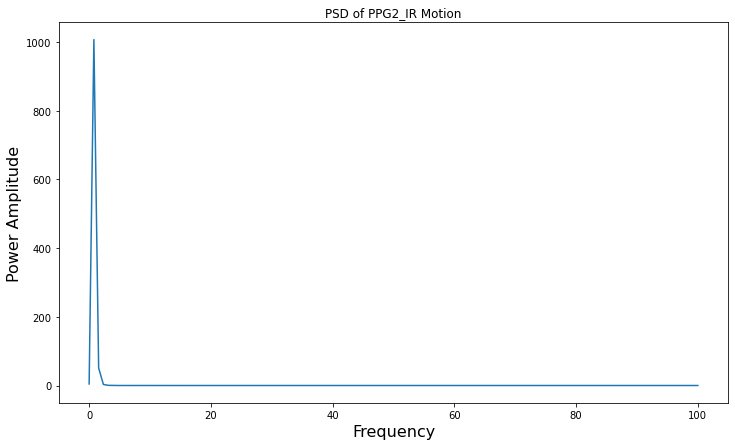

In [1088]:
fs=200
f = interpolate.interp1d((a-np.min(a))/10000, b, kind='cubic')
PSD_freqs_m,PSD_m = sp.signal.welch(f(tmot_new[0]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of ECG Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m,PSD_m)

dom_freq_m = PSD_freqs_m[np.where(PSD_m == max(PSD_m))]
print("\nDominant frequency of motion ECG:  ",dom_freq_m)


f1 = interpolate.interp1d((a1-np.min(a1))/10000, b1, kind='cubic')
PSD_freqs_m1,PSD_m1 = sp.signal.welch(f1(tmot_new[1]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_Green Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m1,PSD_m1)

dom_freq_m1 = PSD_freqs_m1[np.where(PSD_m1 == max(PSD_m1))]
print("\nDominant frequency of motion PPG1_Green :  ",dom_freq_m1)


f2 = interpolate.interp1d((a2-np.min(a2))/10000, b2, kind='cubic')
PSD_freqs_m2,PSD_m2 = sp.signal.welch(f2(tmot_new[2]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_Red Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m2,PSD_m2)

dom_freq_m2 = PSD_freqs_m[np.where(PSD_m2 == max(PSD_m2))]
print("\nDominant frequency of motion PPG1_Red:  ",dom_freq_m2)


f3 = interpolate.interp1d((a3-np.min(a3))/10000, b3, kind='cubic')
PSD_freqs_m3,PSD_m3 = sp.signal.welch(f3(tmot_new[3]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG1_IR Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m3,PSD_m3)

dom_freq_m3 = PSD_freqs_m3[np.where(PSD_m3 == max(PSD_m3))]
print("\nDominant frequency of motion PPG1_IR:  ",dom_freq_m3)


f4 = interpolate.interp1d((a4-np.min(a4))/10000, b4, kind='cubic')
PSD_freqs_m4,PSD_m4 = sp.signal.welch(f4(tmot_new[4]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG2_Green Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m4,PSD_m4)

dom_freq_m4 = PSD_freqs_m4[np.where(PSD_m4 == max(PSD_m4))]
print("\nDominant frequency of motion PPG2_Green:  ",dom_freq_m4)


f5 = interpolate.interp1d((a5-np.min(a5))/10000, b5, kind='cubic')
PSD_freqs_m5,PSD_m5 = sp.signal.welch(f5(tmot_new[5]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG2_Red Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs_m5,PSD_m5)

dom_freq_m5 = PSD_freqs_m5[np.where(PSD_m5 == max(PSD_m5))]
print("\nDominant frequency of motion PPG2_Red:  ",dom_freq_m5)


f6 = interpolate.interp1d((a6-np.min(a6))/10000, b6, kind='cubic')
PSD_freqs_m6,PSD_m6 = sp.signal.welch(f6(tmot_new[6]),fs)

plt.figure(figsize=(12,7))
plt.title("PSD of PPG2_IR Motion")
plt.xlabel("Frequency",fontsize=16)
plt.ylabel("Power Amplitude",fontsize=16)
plt.plot(PSD_freqs6,PSD6)

dom_freq_m6 = PSD_freqs_m6[np.where(PSD_m6 == max(PSD_m6))]
print("\nDominant frequency of motion PPG2_IR:  ",dom_freq_m6)


<br><br>In my case, there is probably an error in my logic regarding some parameters, since all mt PSD's seem to give the same result. However, in general, the welch band carries more important information than fft for both ECG and PCG signals, since it enables us to see the PSD and dominat frequency. For the PPG, the fft can yeld some important information, since on the graph we can identify respiratory and cardiac peaks.<br><br>

<br><br>4. Filter the signal using butterworth and moving average filters using reasonable frequencyband/smoothing so that you are not filtering out the information carrying signal i.e. filter out only out-of-band noise.<br><br>

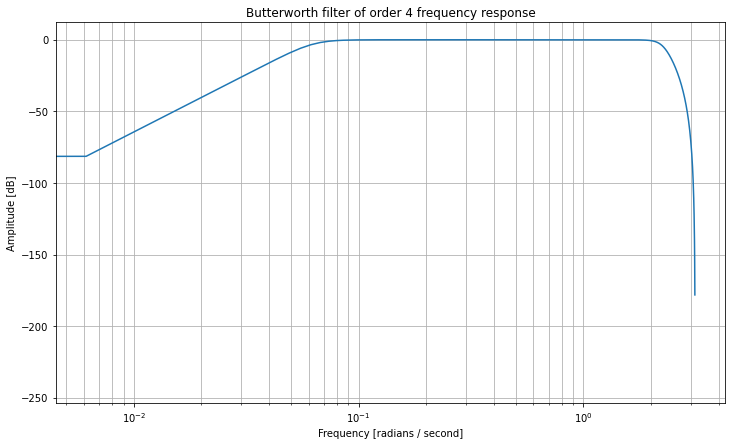

<ipython-input-1089-c81b951a091a>:23: RuntimeWarning: divide by zero encountered in log10
  plt.semilogx(w2, 20 * np.log10(abs(h2)))


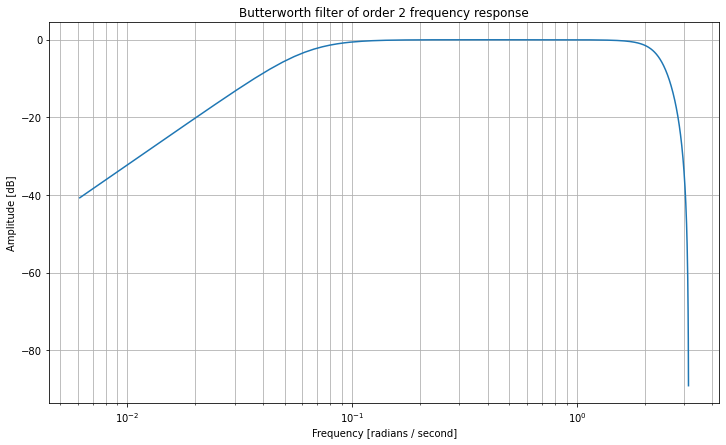

In [1089]:
#code
#Butterworth filter of order 4
r4, t4 = sp.signal.butter(4, [2,70], btype='bandpass', output='ba', fs=200)
#Butterworth filter of order 2
r2, t2 = sp.signal.butter(2, [2,70], btype='bandpass', output='ba', fs=200)
#freqz
w4,h4 = sp.signal.freqz(r4, t4)
w2,h2 = sp.signal.freqz(r2, t2)

#plot for bw order 4
plt.figure(figsize=(12,7))
plt.semilogx(w4, 20 * np.log10(abs(h4)))
plt.title('Butterworth filter of order 4 frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
#plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
#plt.axvline(100, color='green') # cutoff frequency
plt.show()

#plot for bw order 2
plt.figure(figsize=(12,7))
plt.semilogx(w2, 20 * np.log10(abs(h2)))
plt.title('Butterworth filter of order 2 frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.grid(which='both', axis='both')
#plt.axvline(100, color='green') # cutoff frequency
plt.show()

In [2]:
#apply the previously designed Butterworth filter of order 4 to our signal
f = interpolate.interp1d((x-np.min(x))/10000, y, kind='cubic', fill_value="extrapolate")
output_ECG_clean = signal.filtfilt(r4, t4, f(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_ECG_clean)

NameError: name 'interpolate' is not defined

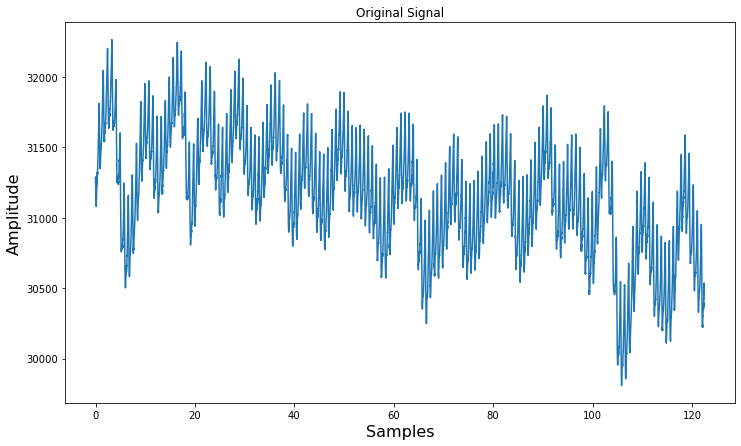

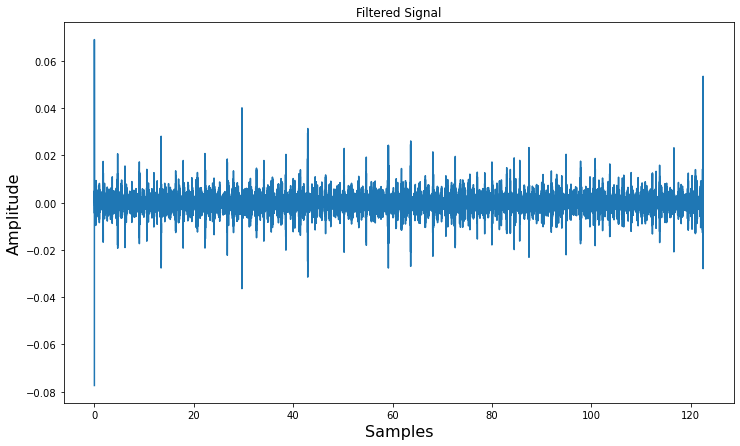

In [1091]:
#apply the previously designed Butterworth filter of order 4 to our signal
f1 = interpolate.interp1d((x1-np.min(x1))/10000, y1, kind='cubic',fill_value="extrapolate")
output_PPG1_Green_clean = signal.filtfilt(r4, t4, f1(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f1(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG1_Green_clean)

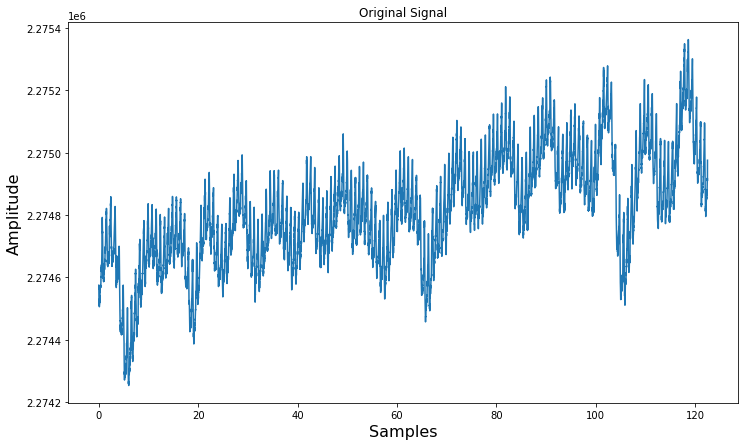

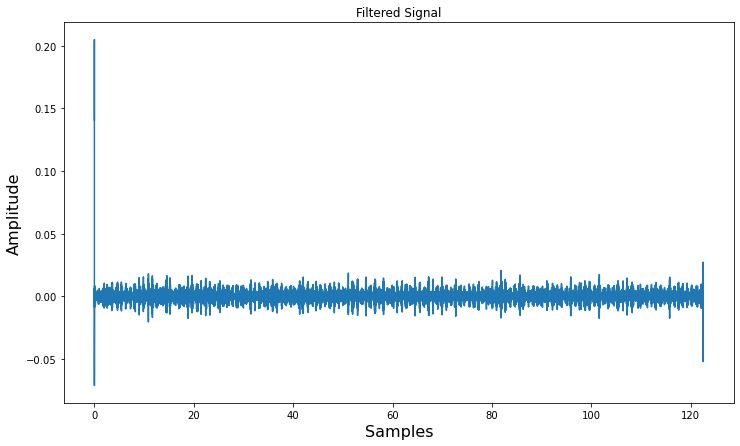

In [1092]:
#apply the previously designed Butterworth filter of order 4 to our signal
f2 = interpolate.interp1d((x2-np.min(x2))/10000, y2, kind='cubic',fill_value="extrapolate")
output_PPG1_Red_clean = signal.filtfilt(r4, t4, f2(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f2(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG1_Red_clean)

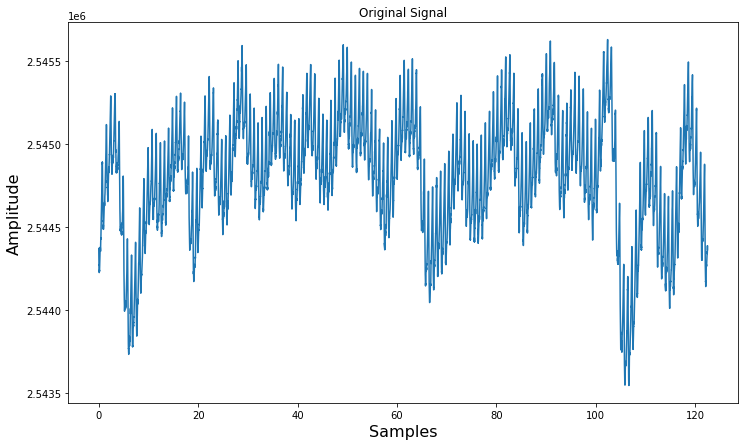

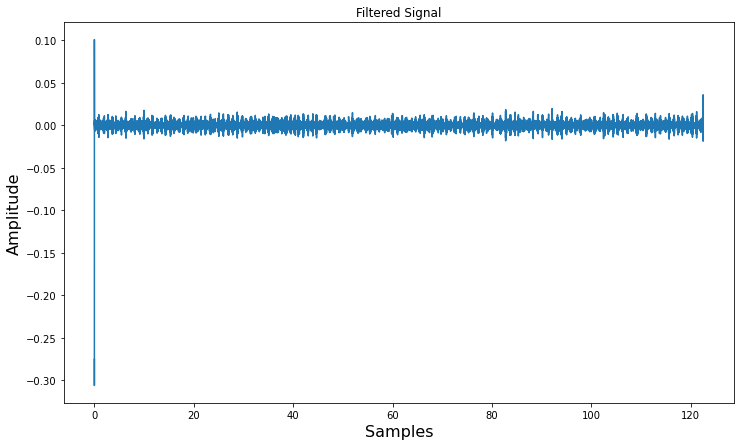

In [1093]:
#apply the previously designed Butterworth filter of order 4 to our signal
f3 = interpolate.interp1d((x3-np.min(x3))/10000, y3, kind='cubic',fill_value="extrapolate")
output_PPG1_IR_clean = signal.filtfilt(r4, t4, f3(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f3(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG1_IR_clean)

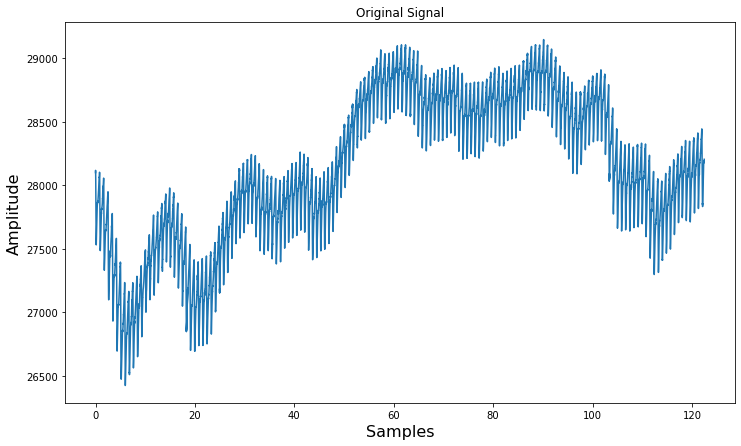

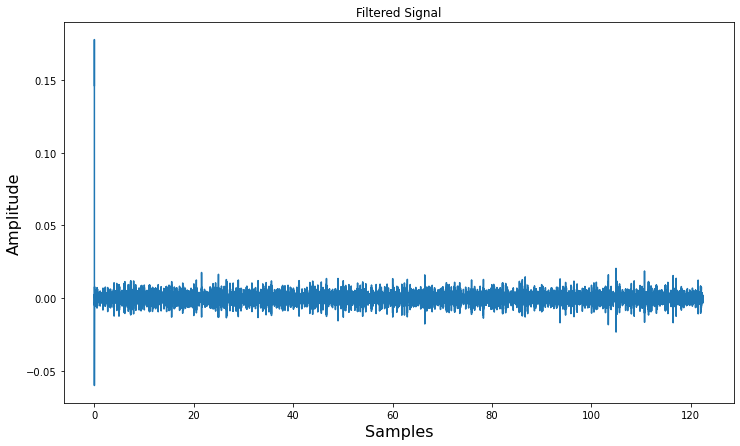

In [1094]:
#apply the previously designed Butterworth filter of order 4 to our signal
f4 = interpolate.interp1d((x4-np.min(x4))/10000, y4, kind='cubic',fill_value="extrapolate")
output_PPG2_Green_clean = signal.filtfilt(r4, t4, f4(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f4(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG2_Green_clean)

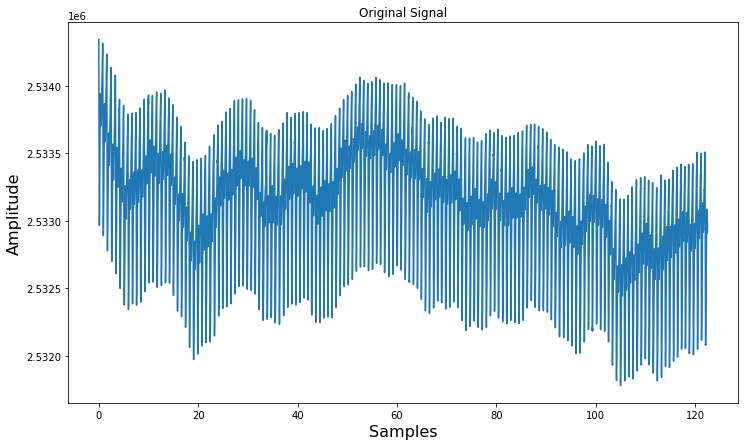

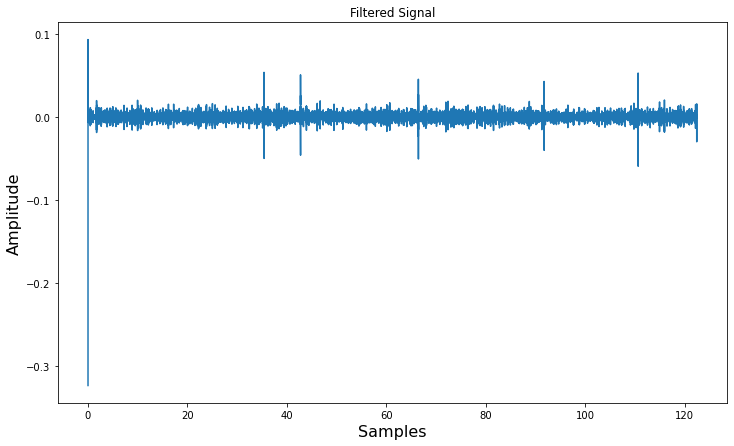

In [1095]:
#apply the previously designed Butterworth filter of order 4 to our signal
f5 = interpolate.interp1d((x5-np.min(x5))/10000, y5, kind='cubic',fill_value="extrapolate")
output_PPG2_Red_clean = signal.filtfilt(r4, t4, f5(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f5(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG2_Red_clean)

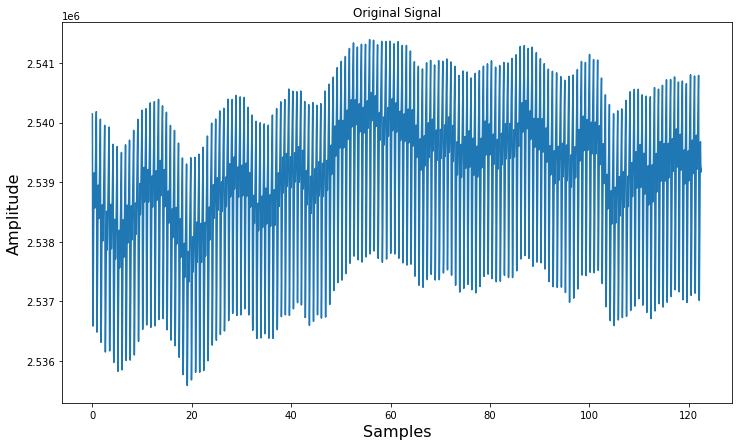

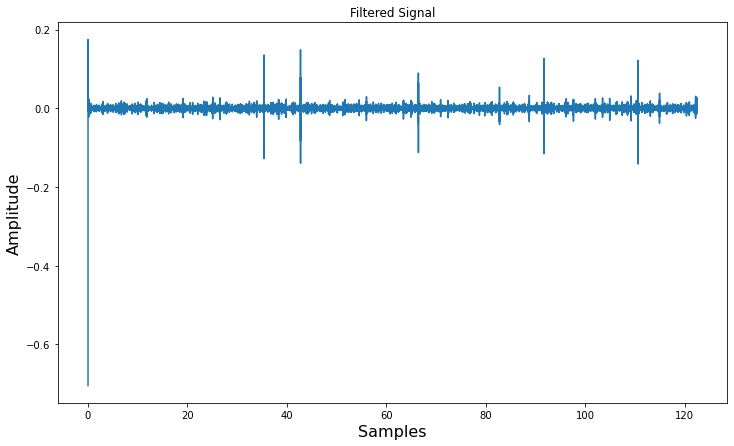

In [1096]:
#apply the previously designed Butterworth filter of order 4 to our signal
f6 = interpolate.interp1d((x6-np.min(x6))/10000, y6, kind='cubic',fill_value="extrapolate")
output_PPG2_IR_clean = signal.filtfilt(r4, t4, f6(cleant_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],f6(cleant_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(cleant_new[0],output_PPG2_IR_clean)

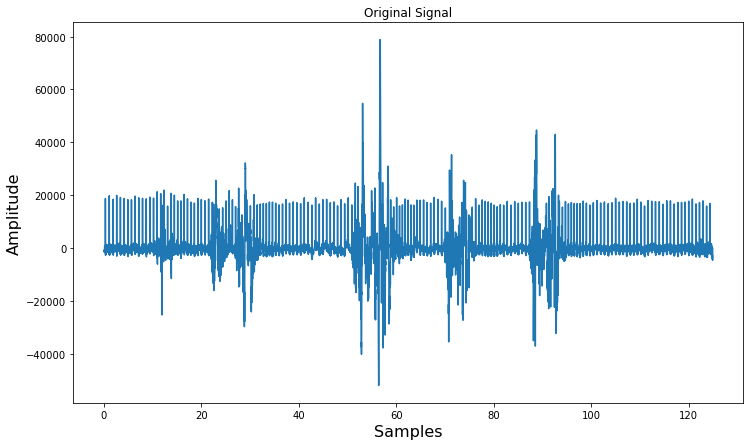

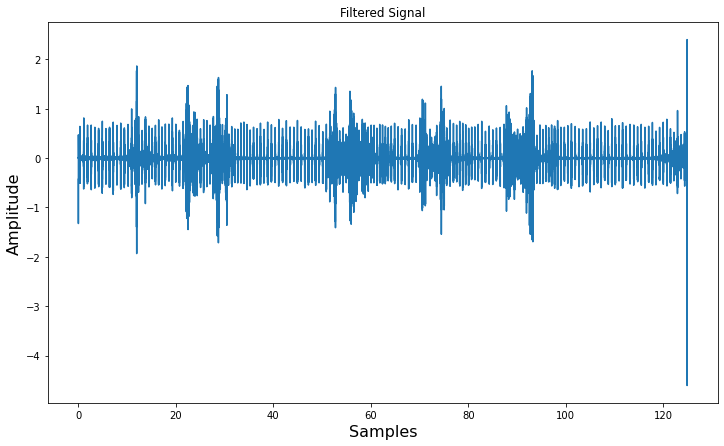

In [1097]:
#apply the previously designed Butterworth filter of order 4 to our signal
f1 = interpolate.interp1d((a-np.min(a))/10000, b, kind='cubic', fill_value="extrapolate")
output_ECG_motion = signal.filtfilt(r4, t4, f1(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f1(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_ECG_motion)

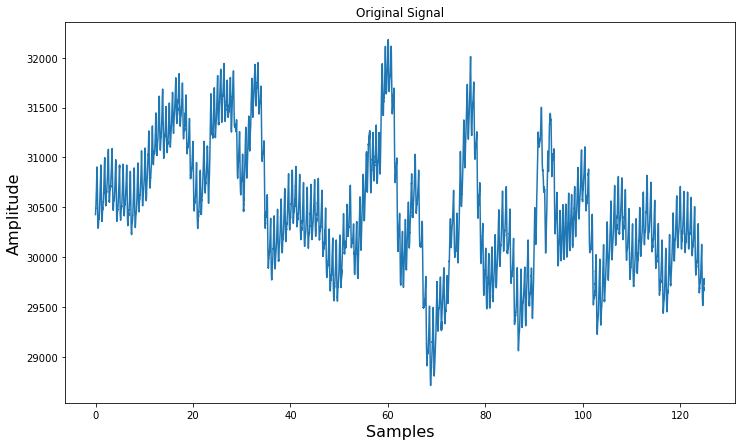

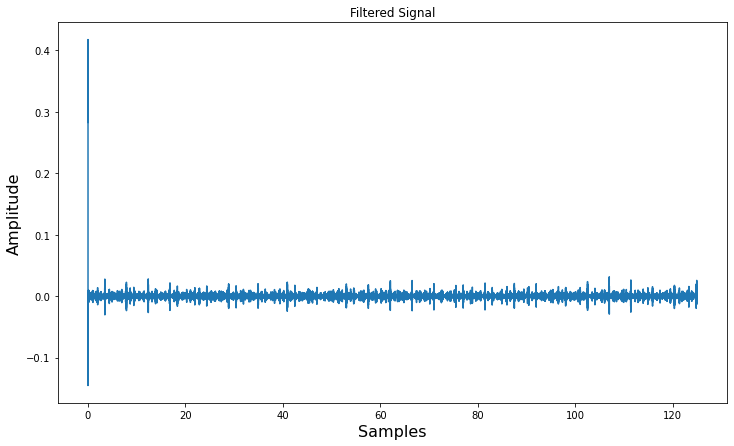

In [1098]:
#apply the previously designed Butterworth filter of order 4 to our signal
f2 = interpolate.interp1d((a1-np.min(a1))/10000, b1, kind='cubic', fill_value="extrapolate")
output_PPG1_Green_motion = signal.filtfilt(r4, t4, f2(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f2(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG1_Green_motion)

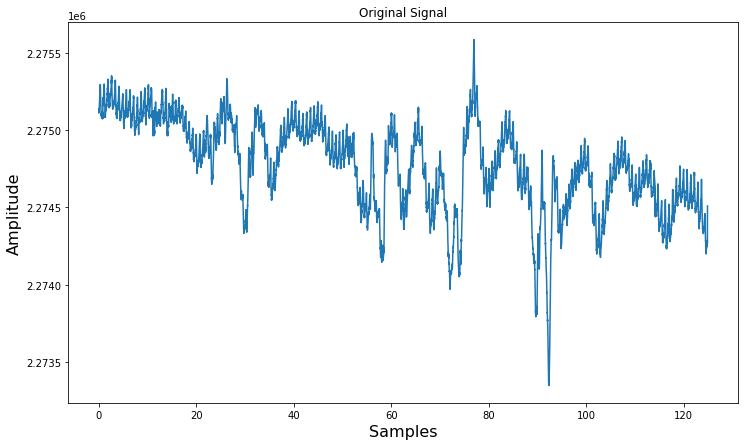

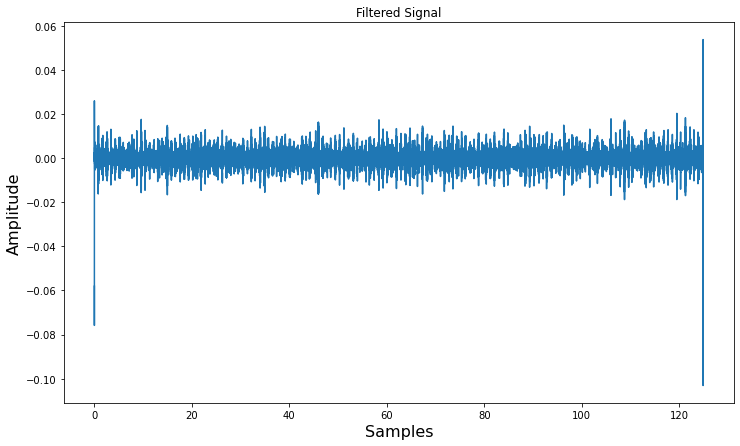

In [1099]:
#apply the previously designed Butterworth filter of order 4 to our signal
f3 = interpolate.interp1d((a2-np.min(a2))/10000, b2, kind='cubic', fill_value="extrapolate")
output_PPG1_Red_motion = signal.filtfilt(r4, t4, f3(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f3(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG1_Red_motion)

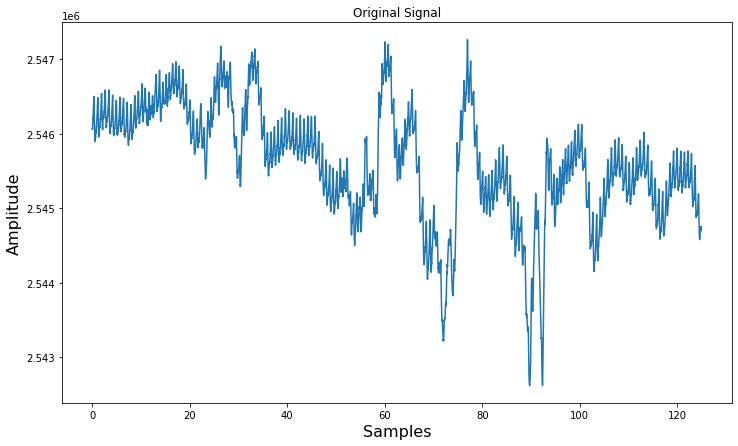

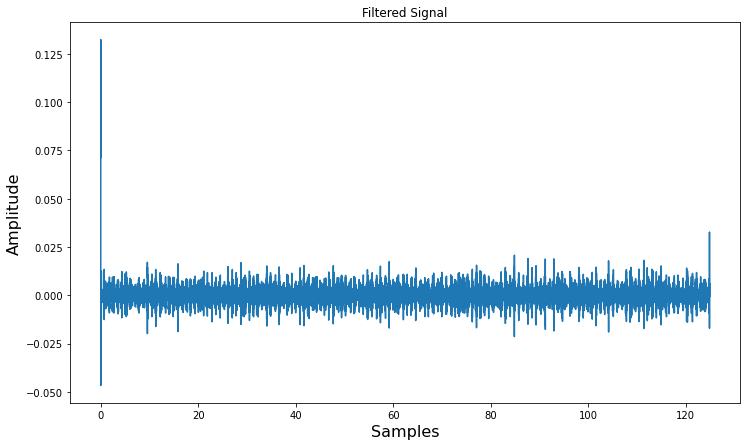

In [1100]:
#apply the previously designed Butterworth filter of order 4 to our signal
f4 = interpolate.interp1d((a3-np.min(a3))/10000, b3, kind='cubic', fill_value="extrapolate")
output_PPG1_IR_motion = signal.filtfilt(r4, t4, f4(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f4(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG1_IR_motion)

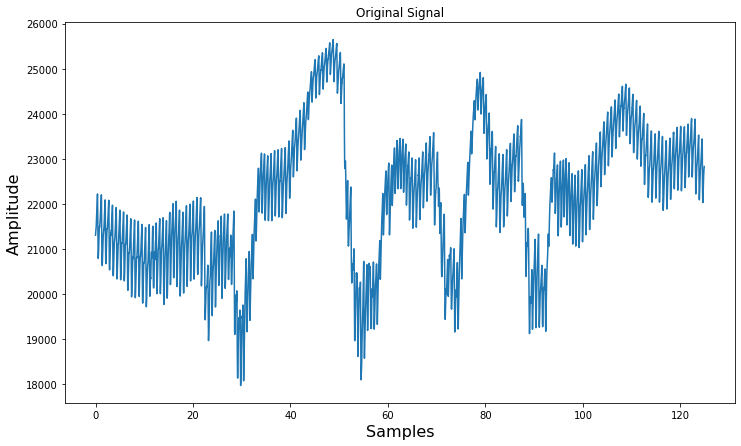

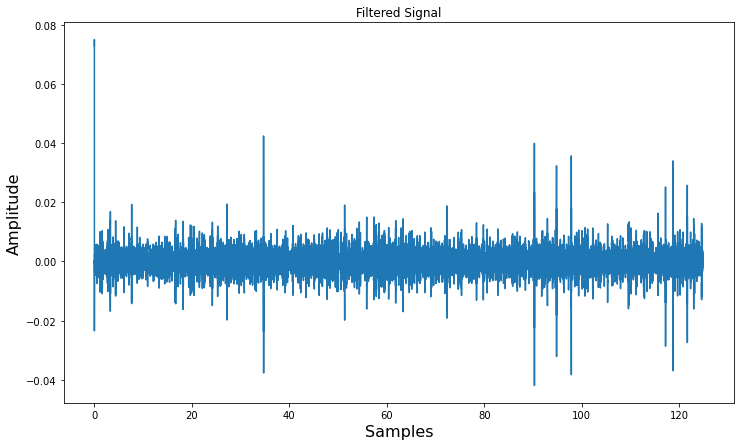

In [1101]:
#apply the previously designed Butterworth filter of order 4 to our signal
f5 = interpolate.interp1d((a4-np.min(a4))/10000, b4, kind='cubic', fill_value="extrapolate")
output_PPG2_Green_motion = signal.filtfilt(r4, t4, f5(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f5(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG2_Green_motion)

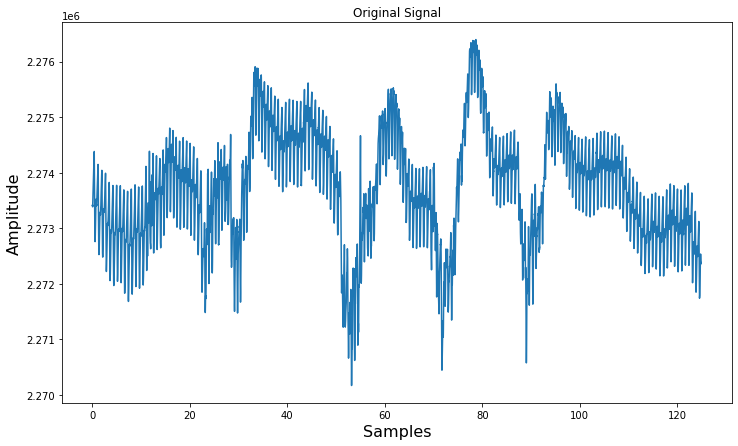

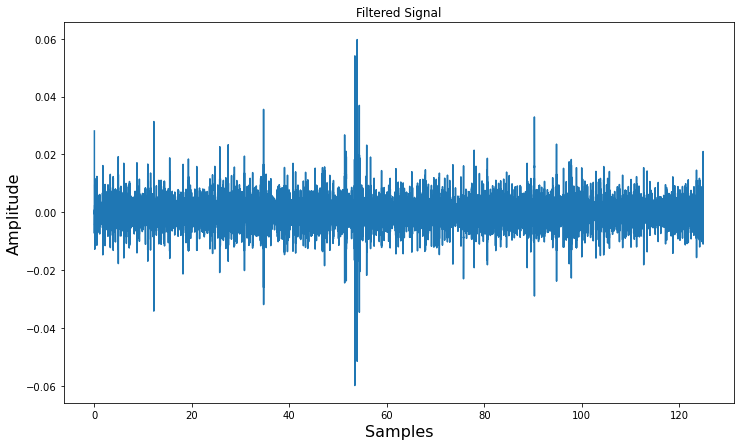

In [1102]:
#apply the previously designed Butterworth filter of order 4 to our signal
f6 = interpolate.interp1d((a5-np.min(a5))/10000, b5, kind='cubic', fill_value="extrapolate")
output_PPG2_Red_motion = signal.filtfilt(r4, t4, f6(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f6(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG2_Red_motion)

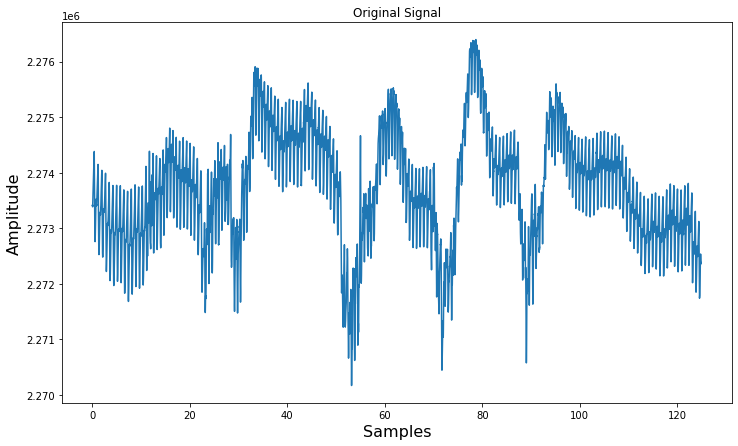

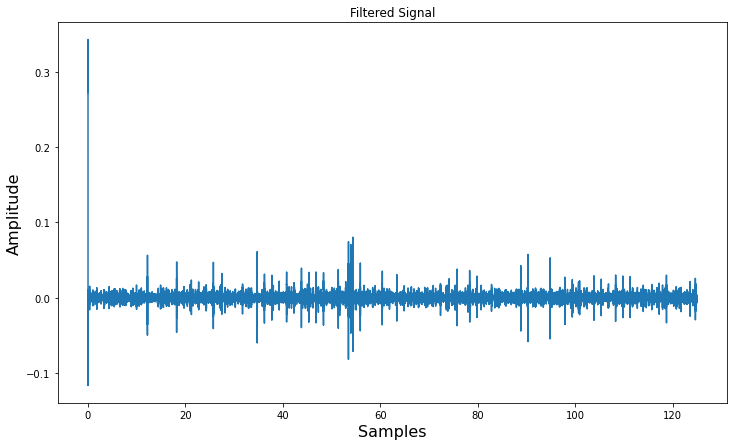

In [1103]:
#apply the previously designed Butterworth filter of order 4 to our signal
f7 = interpolate.interp1d((a6-np.min(a6))/10000, b6, kind='cubic', fill_value="extrapolate")
output_PPG2_IR_motion = signal.filtfilt(r4, t4, f7(tmot_new[0]))

#plot for the original signal
plt.figure(figsize=(12,7))
plt.title("Original Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],f6(tmot_new[0]))

#plot for the filtered signal
plt.figure(figsize=(12,7))
plt.title("Filtered Signal")
plt.xlabel("Samples",fontsize=16)
plt.ylabel("Amplitude",fontsize=16)
plt.plot(tmot_new[0],output_PPG2_IR_motion)

<br><br> Moving average<br><br>

In [1104]:

f = interpolate.interp1d((x-np.min(x))/10000, y, kind='cubic', fill_value="extrapolate")

rolling_mean = f(cleant_new[0]).rolling(window=20).mean()
rolling_mean2 = f(cleant_new[0]).rolling(window=50).mean()
plt.plot(cleant_new[0], f(cleant_new[0]))
plt.plot(cleant_new[0], rolling_mean,  color='orange')
plt.plot(cleant_new[0], rolling_mean2, color='magenta')
plt.legend(loc='upper left')
plt.show()



AttributeError: 'numpy.ndarray' object has no attribute 'rolling'